# An Investigation into Firearm Checks in the United States

## Jeffrey Kalmanson   
<hr style="border-color: #808080;">
     
## Introduction

Mandated by the Brady Handgun Violence Prevention Act of 1993 and launched by the FBI on November 30, 1998, the National Instant Criminal Background Check System (NICS) is used by Federal Firearms Licensees to instantly determine whether a prospective buyer is eligible to buy firearms. Before ringing up the sale, cashiers call in a check to the FBI or to other designated agencies to ensure that each customer does not have a criminal record or isn’t otherwise ineligible to make a purchase.

The FBI provides data on the number of firearm checks by month, state, and type. This study examines the history of data from November 1998 through January 2018.

### Important caveats concerning the study

These statistics represent the number of firearm background checks initiated through the NICS.  
* They do not represent the actual number of firearms sold.  

Based on varying state laws and purchase scenarios, a one-to-one correlation cannot be made between a firearm background check and a firearm sale.

Many checks are for concealed carry permits, not actual gun sales. The FBI’s numbers do **not** include private gun sales, many of which do **not** require a background check. A study conducted by Harvard researchers found that roughly 40 percent of respondents had acquired their most recent firearm without going through a background check.  
* Despite this uncertainty, the FBI’s NICS numbers are widely accepted as the best proxy for total gun sales in a given time period.  

This study uses a 1:1 ratio to proxy background checks to gun sales.

Sales estimates are calculated from handgun, long gun and total number of background checks.   

* Data is examined from the 50 US states and the District of Columbia. The study does not consider gun background checks in the US islands.

## Inquiry

This study aims to answer the following questions:  

1. Identify any trends in gun sales over the time period (using background checks as a sales proxy)  
2. Compare sales of handguns to rifles (long guns) to total sales  
3. Identify the top 3 and bottom 3 states in gun sales and examine the difference

## Methodology

### Databases

In addition to the FBI's NICS database, this study use census data from the US Census Bureau. This is done in order to standardize the data on a per capita basis. Thus an unbiased comparison can be done across states with different populations.
1. FBI NICS Database -- November 1998 - January 2018  
2. US Census Database -- 2010 - 2017  
3. US Census 2000 Database -- 2000 - 2009  
4. US Intercensal Database -- 1998 - 1999  

It is important to note that the population changes over time. When standardizing the data on a per capita basis, the population at that time must be used to accurately compute the per capita.

## Data Wrangling

### Importing the data   

The first step is to load in the data from external files.

In [1]:
# Environment: Python 3.7, NumPy 1.16, Pandas 0.24, MatPlotLib 3.0

import numpy as np
import pandas as pd
import seaborn as sns

# Read in the NICS data

filename = '/Users/jeffkalmanson/Documents/Udacity_Data_Analyst/P2_Ver_2_Data_Analysis/nics-firearm-background-checks.csv'
nics_df = pd.read_csv(filename)
nics_df.head()

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,...,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
0,2018-01,Alabama,23930.0,0.0,5692.0,6199.0,276.0,288,0.0,12.0,...,0.0,0.0,0.0,22.0,34.0,3.0,2.0,1.0,1.0,38477
1,2018-01,Alaska,207.0,6.0,1844.0,1621.0,249.0,137,0.0,0.0,...,0.0,0.0,0.0,13.0,20.0,5.0,0.0,0.0,0.0,4429
2,2018-01,Arizona,5686.0,413.0,11659.0,6992.0,1074.0,531,0.0,10.0,...,0.0,0.0,0.0,30.0,14.0,9.0,0.0,1.0,0.0,28627
3,2018-01,Arkansas,4162.0,555.0,4935.0,5061.0,232.0,323,37.0,7.0,...,0.0,0.0,0.0,13.0,13.0,1.0,0.0,0.0,0.0,17483
4,2018-01,California,55292.0,0.0,37335.0,22919.0,3495.0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119910


**<--** _Scroll left to view full table_ **-->**
     
As the data files are loaded, display the data dictionary of the dataset. This lists all the variables available for the analysis, the data type for the data imported, and the quantity.

In [2]:
# nics_df.info()

#### NICS Data Dictionary   

Column Name | Count | Data Type 
-|-|- 
month | 12705 | non-null string 
state | 12705 | non-null string    
permit   |                    12681 | non-null float64
permit_recheck |              1320 | non-null float64
handgun   |                   12685 | non-null float64
long_gun  |                   12686 | non-null float64
other   |                     5720 | non-null float64
multiple    |                 12705 | non-null int64
admin      |                  12682 | non-null float64
prepawn_handgun   |           10762 | non-null float64
prepawn_long_gun   |          10760 | non-null float64
prepawn_other      |          5335 | non-null float64
redemption_handgun  |         10765 | non-null float64
redemption_long_gun  |        10764 | non-null float64
redemption_other      |       5335 | non-null float64
returned_handgun       |      2420 | non-null float64
returned_long_gun       |     2365 | non-null float64
returned_other      |         2035 | non-null float64
rentals_handgun      |        1210 | non-null float64
rentals_long_gun      |       1045 | non-null float64
private_sale_handgun   |      2970 | non-null float64
private_sale_long_gun   |     2970 | non-null float64
private_sale_other     |      2970 | non-null float64
return_to_seller_handgun  |   2695 | non-null float64
return_to_seller_long_gun  |  2970 | non-null float64
return_to_seller_other  |     2475 | non-null float64
totals        |               12705 | non-null int64

Data columns: 27 columns   
Range Index: 12705 entries, 0 to 12704

During the data import, certain data manipulation can occur, such as removing the numerical thousands separator.

In [3]:
# Read in the Census data 2010 - 2017

filename = '/Users/jeffkalmanson/Documents/Udacity_Data_Analyst/P2_Ver_2_Data_Analysis/Census_population_state_10_17.csv'
census_2010_2017_df = pd.read_csv(filename, thousands = ',')  # Remove thousands separator
census_2010_2017_df.head()

,Geography,"April 1, 2010 - Census","April 1, 2010 - Estimates Base",Population Estimate - 2010,Population Estimate - 2011,Population Estimate - 2012,Population Estimate - 2013,Population Estimate - 2014,Population Estimate - 2015,Population Estimate - 2016,Population Estimate - 2017
0,United States,308745538,308758105,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4779736,4780135,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,710231,710249,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,6392017,6392309,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2915918,2916031,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279


In [4]:
# census_2010_2017_df.info()

#### Census 2010 - 2017 Data Dictionary

Column Name | Count | Data Type 
-|-|- 
Geography       |                  52 | non-null string
April 1, 2010 - Census       |     52 | non-null int64
April 1, 2010 - Estimates Base  |  52 | non-null int64
Population Estimate - 2010 |       52 | non-null int64
Population Estimate - 2011  |      52 | non-null int64
Population Estimate - 2012  |      52 | non-null int64
Population Estimate - 2013   |     52 | non-null int64
Population Estimate - 2014  |      52 | non-null int64
Population Estimate - 2015   |     52 | non-null int64
Population Estimate - 2016   |     52 | non-null int64
Population Estimate - 2017   |     52 | non-null int64

Data columns: 11 columns   
Range Index: 52 entries, 0 to 51

In [5]:
# Read in the Census data 2000 - 2010

filename = '/Users/jeffkalmanson/Documents/Udacity_Data_Analyst/P2_Ver_2_Data_Analysis/Intercensal_pop_est_2000-2010.csv'
census_2000_2010_df = pd.read_csv(filename, thousands = ',')   # Remove thousands separator

census_2000_2010_df.head()

,Geographic Area,"April 1, 2000",Intercensal-2000,Intercensal-2001,Intercensal-2002,Intercensal-2003,Intercensal-2004,Intercensal-2005,Intercensal-2006,Intercensal-2007,Intercensal-2008,Intercensal-2009,"April 1, 2010","July 1, 2010"
0,United States,281424600,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,308745538,309349689
1,Northeast,53594810,53666295,53915522,54143915,54334453,54423533,54451230,54522659,54653362,54875926,55133101,55317240,55361036
2,Midwest,64396653,64491431,64776531,65018293,65276954,65532305,65751872,66028555,66293689,66523935,66748437,66927001,66975848
3,South,100234523,100565549,101849575,103150787,104380188,105883977,107479771,109076933,110688742,112184930,113548615,114555744,114865724
4,West,63198614,63439136,64427327,65312198,66116338,66965483,67833726,68751765,69595414,70509175,71341376,71945553,72147081


**<--** _Scroll left to view full table_ **-->**

In [6]:
# census_2000_2010_df.info()

#### Census 2000 - 2010 Data Dictionary

Column Name | Count | Data Type 
-|-|- 
Geographic Area  |   56 | non-null string
April 1, 2000     |  56 | non-null int64
Intercensal-2000  |  56 | non-null int64
Intercensal-2001  |  56 | non-null int64
Intercensal-2002  |  56 | non-null int64
Intercensal-2003  |  56 | non-null int64
Intercensal-2004  |  56 | non-null int64
Intercensal-2005  |  56 | non-null int64
Intercensal-2006  |  56 | non-null int64
Intercensal-2007  |  56 | non-null int64
Intercensal-2008  |  56 | non-null int64
Intercensal-2009  |  56 | non-null int64
April 1, 2010     |  56 | non-null int64
July 1, 2010      |  56 | non-null int64

Data columns: 14 columns   
Range Index: 56 entries, 0 to 55

In [7]:
# Read in the Census data 1998 - 1999

filename = '/Users/jeffkalmanson/Documents/Udacity_Data_Analyst/P2_Ver_2_Data_Analysis/State_pop_1998-1999.txt'

column_names = ['Area Name', 'Pop Est July 1 1999', 'Pop Est July 1 1998', 'Numeric Change', 'Percent Change', 
              'Births', 'Deaths', 'Net Int\'l Migration', 'Net Domestic Migration']

census_1998_1999_df = pd.read_table(filename, delimiter='\s+', names=column_names, skiprows=3)
# Delimiter is 2 spaces+

census_1998_1999_df.head()

,Area Name,Pop Est July 1 1999,Pop Est July 1 1998,Numeric Change,Percent Change,Births,Deaths,Net Int'l Migration,Net Domestic Migration
0,United_States,272690813,270248003,2442810,0.9,3938472,2344573,851541,0
1,Northeast,51829962,51685676,144286,0.3,685738,475391,183871,-244668
2,New_England,13495933,13428630,67303,0.5,172903,122292,27339,-7621
3,Middle_Atlantic,38334029,38257046,76983,0.2,512835,353099,156532,-237047
4,Midwest,63242284,62950532,291752,0.5,880492,573030,98956,-110980


In [8]:
# census_1998_1999_df.info()

#### Census 1998 - 1999 Data Dictionary

Column Name | Count | Data Type 
-|-|- 
Area Name             |    65 | non-null string
Pop Est July 1 1999   |    65 | non-null int64
Pop Est July 1 1998   |    65 | non-null int64
Numeric Change        |    65 | non-null int64
Percent Change        |    65 | non-null float64
Births                |    65 | non-null int64
Deaths                |    65 | non-null int64
Net Int'l Migration   |    65 | non-null int64
Net Domestic Migration  |  65 | non-null int64

Data columns: 9 columns   
Range Index: 65 entries, 0 to 64   

### Data Cleanup

After importing, the data is cleaned to be usable in the analysis.

In the Census data 2000 - 2010, the states have a period before the state name, for example, ".California"  
* Remove the period from the state name in this data frame   

In the Census data 1998 - 1999, the geographic names have an underscore instead of a space, for example, "New_York"  
* Remove the underscore from the name and replace it with a space 

In [9]:
# Remove the period from the state name in the Census data 2000 - 2010

# Select the column named Geographic Area using all rows
states_period = census_2000_2010_df.loc[ : , 'Geographic Area']

# Scan thru the values and remove the period
# Test and check results
fixit = states_period.str.replace('.', '')   # replace() operates on a Series
print (fixit.head(10))
print ()

# Looks good, now fix it in the data frame
census_2000_2010_df['Geographic Area'] = census_2000_2010_df.loc[ : , 'Geographic Area'].str.replace('.', '')

census_2000_2010_df.head(10)

0    United States
1        Northeast
2          Midwest
3            South
4             West
5          Alabama
6           Alaska
7          Arizona
8         Arkansas
9       California
Name: Geographic Area, dtype: object



,Geographic Area,"April 1, 2000",Intercensal-2000,Intercensal-2001,Intercensal-2002,Intercensal-2003,Intercensal-2004,Intercensal-2005,Intercensal-2006,Intercensal-2007,Intercensal-2008,Intercensal-2009,"April 1, 2010","July 1, 2010"
0,United States,281424600,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,308745538,309349689
1,Northeast,53594810,53666295,53915522,54143915,54334453,54423533,54451230,54522659,54653362,54875926,55133101,55317240,55361036
2,Midwest,64396653,64491431,64776531,65018293,65276954,65532305,65751872,66028555,66293689,66523935,66748437,66927001,66975848
3,South,100234523,100565549,101849575,103150787,104380188,105883977,107479771,109076933,110688742,112184930,113548615,114555744,114865724
4,West,63198614,63439136,64427327,65312198,66116338,66965483,67833726,68751765,69595414,70509175,71341376,71945553,72147081
5,Alabama,4447207,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4779736,4785298
6,Alaska,626933,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,710231,713985
7,Arizona,5130247,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6392017,6413737
8,Arkansas,2673293,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2915918,2921606
9,California,33871653,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37253956,37349363


**<--** _Scroll left to view full table_ **-->**

In [10]:
# Remove the underscore from the state name in the Census data 1998 - 1999 and replace it with a space

# Select the column named Area Name using all rows
states_underscore = census_1998_1999_df.loc[ : , 'Area Name']

# Scan thru the values, remove the underscore, and insert a space
# Test and check results
fixit = states_underscore.str.replace('_', ' ')   # replace() operates on a Series
print (fixit.head(10))
print ()

# Looks good, now fix it in the data frame
census_1998_1999_df['Area Name'] = census_1998_1999_df.loc[ : , 'Area Name'].str.replace('_', ' ')

census_1998_1999_df.head(10)

0         United States
1             Northeast
2           New England
3       Middle Atlantic
4               Midwest
5    East North Central
6    West North Central
7                 South
8        South Atlantic
9    East South Central
Name: Area Name, dtype: object



,Area Name,Pop Est July 1 1999,Pop Est July 1 1998,Numeric Change,Percent Change,Births,Deaths,Net Int'l Migration,Net Domestic Migration
0,United States,272690813,270248003,2442810,0.9,3938472,2344573,851541,0
1,Northeast,51829962,51685676,144286,0.3,685738,475391,183871,-244668
2,New England,13495933,13428630,67303,0.5,172903,122292,27339,-7621
3,Middle Atlantic,38334029,38257046,76983,0.2,512835,353099,156532,-237047
4,Midwest,63242284,62950532,291752,0.5,880492,573030,98956,-110980
5,East North Central,44442146,44257498,184648,0.4,622115,398409,74658,-110754
6,West North Central,18800138,18693034,107104,0.6,258377,174621,24298,-226
7,South,96468455,95348823,1119632,1.2,1421264,860469,243917,310928
8,South Atlantic,49560021,48926635,633386,1.3,688451,451824,146011,248237
9,East South Central,16582841,16469361,113480,0.7,236856,163268,8865,31624


### Data Types

Check the data types of the imported data and convert to the correct type if necessary. For example if a number is imported as a string, then convert it to an integer or float.

In [11]:
nics_df.dtypes

month                         object
state                         object
permit                       float64
permit_recheck               float64
handgun                      float64
long_gun                     float64
other                        float64
multiple                       int64
admin                        float64
prepawn_handgun              float64
prepawn_long_gun             float64
prepawn_other                float64
redemption_handgun           float64
redemption_long_gun          float64
redemption_other             float64
returned_handgun             float64
returned_long_gun            float64
returned_other               float64
rentals_handgun              float64
rentals_long_gun             float64
private_sale_handgun         float64
private_sale_long_gun        float64
private_sale_other           float64
return_to_seller_handgun     float64
return_to_seller_long_gun    float64
return_to_seller_other       float64
totals                         int64
d

   
In the NICS dataset, the **month** field imported as a string. Convert month to a date.   
   

In [12]:
import datetime

nics_df['month'] = pd.to_datetime(nics_df['month'], yearfirst=True, format='%Y-%m')

nics_df.head(10)

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,...,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
0,2018-01-01,Alabama,23930.0,0.0,5692.0,6199.0,276.0,288,0.0,12.0,...,0.0,0.0,0.0,22.0,34.0,3.0,2.0,1.0,1.0,38477
1,2018-01-01,Alaska,207.0,6.0,1844.0,1621.0,249.0,137,0.0,0.0,...,0.0,0.0,0.0,13.0,20.0,5.0,0.0,0.0,0.0,4429
2,2018-01-01,Arizona,5686.0,413.0,11659.0,6992.0,1074.0,531,0.0,10.0,...,0.0,0.0,0.0,30.0,14.0,9.0,0.0,1.0,0.0,28627
3,2018-01-01,Arkansas,4162.0,555.0,4935.0,5061.0,232.0,323,37.0,7.0,...,0.0,0.0,0.0,13.0,13.0,1.0,0.0,0.0,0.0,17483
4,2018-01-01,California,55292.0,0.0,37335.0,22919.0,3495.0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119910
5,2018-01-01,Colorado,9683.0,0.0,17498.0,12153.0,1307.0,1070,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41989
6,2018-01-01,Connecticut,6015.0,503.0,5044.0,1829.0,384.0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13775
7,2018-01-01,Delaware,639.0,0.0,1422.0,1224.0,91.0,60,0.0,0.0,...,0.0,0.0,0.0,61.0,41.0,3.0,2.0,1.0,0.0,3684
8,2018-01-01,District of Columbia,206.0,0.0,72.0,4.0,0.0,0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,283
9,2018-01-01,Florida,19683.0,0.0,48377.0,20690.0,3299.0,1737,10.0,13.0,...,2.0,0.0,0.0,33.0,11.0,0.0,0.0,0.0,0.0,98243


**<--** _Scroll left to view full table_ **-->**

In [13]:
nics_df.dtypes  # Check the conversion

month                        datetime64[ns]
state                                object
permit                              float64
permit_recheck                      float64
handgun                             float64
long_gun                            float64
other                               float64
multiple                              int64
admin                               float64
prepawn_handgun                     float64
prepawn_long_gun                    float64
prepawn_other                       float64
redemption_handgun                  float64
redemption_long_gun                 float64
redemption_other                    float64
returned_handgun                    float64
returned_long_gun                   float64
returned_other                      float64
rentals_handgun                     float64
rentals_long_gun                    float64
private_sale_handgun                float64
private_sale_long_gun               float64
private_sale_other              

In [14]:
nics_df['month'].values  # Take a peek at the values

array(['2018-01-01T00:00:00.000000000', '2018-01-01T00:00:00.000000000',
       '2018-01-01T00:00:00.000000000', ...,
       '1998-11-01T00:00:00.000000000', '1998-11-01T00:00:00.000000000',
       '1998-11-01T00:00:00.000000000'], dtype='datetime64[ns]')

   
**Check the data types for the Census data.**
   

In [15]:
census_2010_2017_df.dtypes

Geography                         object
April 1, 2010 - Census             int64
April 1, 2010 - Estimates Base     int64
Population Estimate - 2010         int64
Population Estimate - 2011         int64
Population Estimate - 2012         int64
Population Estimate - 2013         int64
Population Estimate - 2014         int64
Population Estimate - 2015         int64
Population Estimate - 2016         int64
Population Estimate - 2017         int64
dtype: object

In [16]:
census_2000_2010_df.dtypes

Geographic Area     object
April 1, 2000        int64
Intercensal-2000     int64
Intercensal-2001     int64
Intercensal-2002     int64
Intercensal-2003     int64
Intercensal-2004     int64
Intercensal-2005     int64
Intercensal-2006     int64
Intercensal-2007     int64
Intercensal-2008     int64
Intercensal-2009     int64
April 1, 2010        int64
July 1, 2010         int64
dtype: object

In [17]:
census_1998_1999_df.dtypes

Area Name                  object
Pop Est July 1 1999         int64
Pop Est July 1 1998         int64
Numeric Change              int64
Percent Change            float64
Births                      int64
Deaths                      int64
Net Int'l Migration         int64
Net Domestic Migration      int64
dtype: object

   
The Census data were correctly imported as numbers.
   

### Merge Data

At this point, the data is loaded and cleaned. Move and arrange the data into the desired data structures to be used in the computation.   

Merge the census data into one dataset spanning all dates (1998 to 2017).
   

In [18]:
# Merge the data from 2000 - 2017

census_all_2000_df = census_2000_2010_df.merge(census_2010_2017_df, left_on='Geographic Area', 
                                               right_on='Geography', how='inner')
pd.set_option('display.max_columns', 30)

census_all_2000_df.head(10)

,Geographic Area,"April 1, 2000",Intercensal-2000,Intercensal-2001,Intercensal-2002,Intercensal-2003,Intercensal-2004,Intercensal-2005,Intercensal-2006,Intercensal-2007,Intercensal-2008,Intercensal-2009,"April 1, 2010","July 1, 2010",Geography,"April 1, 2010 - Census","April 1, 2010 - Estimates Base",Population Estimate - 2010,Population Estimate - 2011,Population Estimate - 2012,Population Estimate - 2013,Population Estimate - 2014,Population Estimate - 2015,Population Estimate - 2016,Population Estimate - 2017
0,United States,281424600,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,308745538,309349689,United States,308745538,308758105,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4447207,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4779736,4785298,Alabama,4779736,4780135,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,626933,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,710231,713985,Alaska,710231,710249,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,5130247,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6392017,6413737,Arizona,6392017,6392309,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2673293,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2915918,2921606,Arkansas,2915918,2916031,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
5,California,33871653,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37253956,37349363,California,37253956,37254518,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
6,Colorado,4302086,4326921,4425687,4490406,4528732,4575013,4631888,4720423,4803868,4889730,4972195,5029196,5049071,Colorado,5029196,5029325,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
7,Connecticut,3405650,3411777,3432835,3458749,3484336,3496094,3506956,3517460,3527270,3545579,3561807,3574097,3577073,Connecticut,3574097,3574114,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
8,Delaware,783559,786373,795699,806169,818003,830803,845150,859268,871749,883874,891730,897934,899769,Delaware,897934,897936,899712,907884,916868,925114,934805,944107,952698,961939
9,District of Columbia,572086,572046,574504,573158,568502,567754,567136,570681,574404,580236,592228,601723,604453,District of Columbia,601723,601766,605040,620336,635630,650114,660797,672736,684336,693972


**<--** _Scroll left to view full table_ **-->**

In [19]:
# Merge in the data from 1998 - 1999 for all data 1998 - 2017

census_all_df = census_1998_1999_df.merge(census_all_2000_df, left_on='Area Name' , right_on='Geographic Area', 
                                          how='inner')

census_all_df.head(10)

,Area Name,Pop Est July 1 1999,Pop Est July 1 1998,Numeric Change,Percent Change,Births,Deaths,Net Int'l Migration,Net Domestic Migration,Geographic Area,"April 1, 2000",Intercensal-2000,Intercensal-2001,Intercensal-2002,Intercensal-2003,...,Intercensal-2008,Intercensal-2009,"April 1, 2010","July 1, 2010",Geography,"April 1, 2010 - Census","April 1, 2010 - Estimates Base",Population Estimate - 2010,Population Estimate - 2011,Population Estimate - 2012,Population Estimate - 2013,Population Estimate - 2014,Population Estimate - 2015,Population Estimate - 2016,Population Estimate - 2017
0,United States,272690813,270248003,2442810,0.9,3938472,2344573,851541,0,United States,281424600,282162411,284968955,287625193,290107933,...,304093966,306771529,308745538,309349689,United States,308745538,308758105,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4369862,4351037,18825,0.4,62047,43831,1590,-611,Alabama,4447207,4452173,4467634,4480089,4503491,...,4718206,4757938,4779736,4785298,Alabama,4779736,4780135,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,619500,615205,4295,0.7,9913,2614,963,-4076,Alaska,626933,627963,633714,642337,648414,...,687455,698895,710231,713985,Alaska,710231,710249,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,4778332,4667277,111055,2.4,78120,38971,11634,59196,Arizona,5130247,5160586,5273477,5396255,5510364,...,6280362,6343154,6392017,6413737,Arizona,6392017,6392309,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2551373,2538202,13171,0.5,36882,27454,1330,2422,Arkansas,2673293,2678588,2691571,2705927,2724816,...,2874554,2896843,2915918,2921606,Arkansas,2915918,2916031,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
5,California,33145121,32682794,462327,1.4,522160,225723,248490,-80952,California,33871653,33987977,34479458,34871843,35253159,...,36604337,36961229,37253956,37349363,California,37253956,37254518,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
6,Colorado,4056133,3968967,87166,2.2,59709,26853,8639,44614,Colorado,4302086,4326921,4425687,4490406,4528732,...,4889730,4972195,5029196,5049071,Colorado,5029196,5029325,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
7,Connecticut,3282031,3272563,9468,0.3,43499,29991,8259,-11447,Connecticut,3405650,3411777,3432835,3458749,3484336,...,3545579,3561807,3574097,3577073,Connecticut,3574097,3574114,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
8,Delaware,753538,744066,9472,1.3,10591,6677,1160,4512,Delaware,783559,786373,795699,806169,818003,...,883874,891730,897934,899769,Delaware,897934,897936,899712,907884,916868,925114,934805,944107,952698,961939
9,District of Columbia,519000,521426,-2426,-0.5,7668,5893,2941,-7227,District of Columbia,572086,572046,574504,573158,568502,...,580236,592228,601723,604453,District of Columbia,601723,601766,605040,620336,635630,650114,660797,672736,684336,693972


**<--** _Scroll left to view full table_ **-->**
     
### Clean Up the Data Frames
   
In the unified census data structure, remove the data not used in the analysis. This minimizes the computing structures to reduce memory usage and less clutter helps to avoid errors.
   

In [20]:
# Remove unneeded columns from the merged Census data frame

remove_cols = ['April 1, 2010 - Census', 'April 1, 2010 - Estimates Base', 'April 1, 2010', 'July 1, 2010', 
               'April 1, 2000', 'Geography', 'Numeric Change', 'Percent Change', 'Births', 'Deaths', 
               'Net Int\'l Migration', 'Net Domestic Migration', 'Geographic Area']

census_all_df.drop(labels=remove_cols, axis='columns', inplace=True, errors='raise')

census_all_df.head(10)

,Area Name,Pop Est July 1 1999,Pop Est July 1 1998,Intercensal-2000,Intercensal-2001,Intercensal-2002,Intercensal-2003,Intercensal-2004,Intercensal-2005,Intercensal-2006,Intercensal-2007,Intercensal-2008,Intercensal-2009,Population Estimate - 2010,Population Estimate - 2011,Population Estimate - 2012,Population Estimate - 2013,Population Estimate - 2014,Population Estimate - 2015,Population Estimate - 2016,Population Estimate - 2017
0,United States,272690813,270248003,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4369862,4351037,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,619500,615205,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,4778332,4667277,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2551373,2538202,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
5,California,33145121,32682794,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
6,Colorado,4056133,3968967,4326921,4425687,4490406,4528732,4575013,4631888,4720423,4803868,4889730,4972195,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
7,Connecticut,3282031,3272563,3411777,3432835,3458749,3484336,3496094,3506956,3517460,3527270,3545579,3561807,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
8,Delaware,753538,744066,786373,795699,806169,818003,830803,845150,859268,871749,883874,891730,899712,907884,916868,925114,934805,944107,952698,961939
9,District of Columbia,519000,521426,572046,574504,573158,568502,567754,567136,570681,574404,580236,592228,605040,620336,635630,650114,660797,672736,684336,693972


**<--** _Scroll left to view full table_ **-->**

In [21]:
census_all_df.dtypes  # Check the result

Area Name                     object
Pop Est July 1 1999            int64
Pop Est July 1 1998            int64
Intercensal-2000               int64
Intercensal-2001               int64
Intercensal-2002               int64
Intercensal-2003               int64
Intercensal-2004               int64
Intercensal-2005               int64
Intercensal-2006               int64
Intercensal-2007               int64
Intercensal-2008               int64
Intercensal-2009               int64
Population Estimate - 2010     int64
Population Estimate - 2011     int64
Population Estimate - 2012     int64
Population Estimate - 2013     int64
Population Estimate - 2014     int64
Population Estimate - 2015     int64
Population Estimate - 2016     int64
Population Estimate - 2017     int64
dtype: object

   
With only the essential data in the set, rename the data columns to avoid confusion and errors.
   

In [22]:
# Rename the columns in the merged Census data frame

census_all_df.rename(inplace=True, index=str, columns={"Pop Est July 1 1999": "1999", "Pop Est July 1 1998": "1998", 
                                         "Intercensal-2000": "2000", "Intercensal-2001": "2001", 
                                         "Intercensal-2002": "2002", "Intercensal-2003": "2003", 
                                         "Intercensal-2004": "2004", "Intercensal-2005": "2005", 
                                         "Intercensal-2006": "2006", "Intercensal-2007": "2007",
                                         "Intercensal-2008": "2008", "Intercensal-2009": "2009", 
                                         "Population Estimate - 2010": "2010", "Population Estimate - 2011": "2011", 
                                         "Population Estimate - 2012": "2012", "Population Estimate - 2013": "2013", 
                                         "Population Estimate - 2014": "2014", "Population Estimate - 2015": "2015",
                                         "Population Estimate - 2016": "2016", "Population Estimate - 2017": "2017"   })

census_all_df.head(10)

,Area Name,1999,1998,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,United States,272690813,270248003,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4369862,4351037,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,619500,615205,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,4778332,4667277,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2551373,2538202,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
5,California,33145121,32682794,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
6,Colorado,4056133,3968967,4326921,4425687,4490406,4528732,4575013,4631888,4720423,4803868,4889730,4972195,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
7,Connecticut,3282031,3272563,3411777,3432835,3458749,3484336,3496094,3506956,3517460,3527270,3545579,3561807,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
8,Delaware,753538,744066,786373,795699,806169,818003,830803,845150,859268,871749,883874,891730,899712,907884,916868,925114,934805,944107,952698,961939
9,District of Columbia,519000,521426,572046,574504,573158,568502,567754,567136,570681,574404,580236,592228,605040,620336,635630,650114,660797,672736,684336,693972


**<--** _Scroll left to view full table_ **-->**
         
Rearrange certain data columns to structure the data frame in a logical order.
&nbsp;     
&nbsp;   

In [23]:
# Swap the 1999 and 1998 columns in the merged Census data frame

census_all_df = census_all_df.reindex(columns=['Area Name','1998','1999','2000','2001','2002','2003','2004','2005',
                                               '2006','2007','2008','2009','2010','2011','2012','2013','2014',
                                               '2015','2016','2017'] )

census_all_df.head(10)

,Area Name,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,United States,270248003,272690813,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
1,Alabama,4351037,4369862,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
2,Alaska,615205,619500,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,714015,722259,730825,736760,736759,737979,741522,739795
3,Arizona,4667277,4778332,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
4,Arkansas,2538202,2551373,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
5,California,32682794,33145121,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
6,Colorado,3968967,4056133,4326921,4425687,4490406,4528732,4575013,4631888,4720423,4803868,4889730,4972195,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
7,Connecticut,3272563,3282031,3411777,3432835,3458749,3484336,3496094,3506956,3517460,3527270,3545579,3561807,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
8,Delaware,744066,753538,786373,795699,806169,818003,830803,845150,859268,871749,883874,891730,899712,907884,916868,925114,934805,944107,952698,961939
9,District of Columbia,521426,519000,572046,574504,573158,568502,567754,567136,570681,574404,580236,592228,605040,620336,635630,650114,660797,672736,684336,693972


**<--** _Scroll left to view full table_ **-->**
     

In [24]:
census_all_df.dtypes  # Run a check

Area Name    object
1998          int64
1999          int64
2000          int64
2001          int64
2002          int64
2003          int64
2004          int64
2005          int64
2006          int64
2007          int64
2008          int64
2009          int64
2010          int64
2011          int64
2012          int64
2013          int64
2014          int64
2015          int64
2016          int64
2017          int64
dtype: object

At this point, the Census population dataset is ready for the analysis.   
Attention is turned to the NICS data.

**Remove unused data from the NICS dataset.**
   

In [25]:
# NICS cleanup -- remove unused data

df = pd.DataFrame

# df = nics_df[nics_df['state'] == 'Guam']     # Selects all the TRUE rows --> returns a DataFrame

remove_set = ['Guam', 'Mariana Islands', 'Puerto Rico', 'Virgin Islands']
df = nics_df[nics_df['state'].isin(remove_set)]    # Selects all the TRUE rows --> returns a DataFrame
nics_df.drop(df.index, inplace=True)

nics_df.head(10)

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,prepawn_long_gun,prepawn_other,redemption_handgun,redemption_long_gun,redemption_other,returned_handgun,returned_long_gun,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
0,2018-01-01,Alabama,23930.0,0.0,5692.0,6199.0,276.0,288,0.0,12.0,12.0,0.0,1050.0,954.0,1.0,0.0,0.0,0.0,0.0,0.0,22.0,34.0,3.0,2.0,1.0,1.0,38477
1,2018-01-01,Alaska,207.0,6.0,1844.0,1621.0,249.0,137,0.0,0.0,0.0,0.0,170.0,124.0,0.0,18.0,15.0,0.0,0.0,0.0,13.0,20.0,5.0,0.0,0.0,0.0,4429
2,2018-01-01,Arizona,5686.0,413.0,11659.0,6992.0,1074.0,531,0.0,10.0,5.0,2.0,1357.0,679.0,4.0,154.0,7.0,0.0,0.0,0.0,30.0,14.0,9.0,0.0,1.0,0.0,28627
3,2018-01-01,Arkansas,4162.0,555.0,4935.0,5061.0,232.0,323,37.0,7.0,6.0,0.0,955.0,1181.0,2.0,0.0,0.0,0.0,0.0,0.0,13.0,13.0,1.0,0.0,0.0,0.0,17483
4,2018-01-01,California,55292.0,0.0,37335.0,22919.0,3495.0,0,0.0,0.0,0.0,0.0,496.0,366.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119910
5,2018-01-01,Colorado,9683.0,0.0,17498.0,12153.0,1307.0,1070,0.0,0.0,0.0,0.0,0.0,0.0,0.0,235.0,42.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41989
6,2018-01-01,Connecticut,6015.0,503.0,5044.0,1829.0,384.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13775
7,2018-01-01,Delaware,639.0,0.0,1422.0,1224.0,91.0,60,0.0,0.0,0.0,0.0,28.0,24.0,2.0,86.0,0.0,0.0,0.0,0.0,61.0,41.0,3.0,2.0,1.0,0.0,3684
8,2018-01-01,District of Columbia,206.0,0.0,72.0,4.0,0.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,283
9,2018-01-01,Florida,19683.0,0.0,48377.0,20690.0,3299.0,1737,10.0,13.0,4.0,0.0,2866.0,1096.0,2.0,373.0,47.0,2.0,0.0,0.0,33.0,11.0,0.0,0.0,0.0,0.0,98243


**<--** _Scroll left to view full table_ **-->**
     
Run a count for the cleaned up NICS data frame to check the data set.
&nbsp;     
&nbsp;     

In [26]:
nics_df.count()

month                        11781
state                        11781
permit                       11779
permit_recheck                1224
handgun                      11781
long_gun                     11781
other                         5304
multiple                     11781
admin                        11779
prepawn_handgun               9993
prepawn_long_gun              9991
prepawn_other                 4947
redemption_handgun            9995
redemption_long_gun           9994
redemption_other              4947
returned_handgun              2244
returned_long_gun             2193
returned_other                1887
rentals_handgun               1122
rentals_long_gun               969
private_sale_handgun          2754
private_sale_long_gun         2754
private_sale_other            2754
return_to_seller_handgun      2499
return_to_seller_long_gun     2754
return_to_seller_other        2295
totals                       11781
dtype: int64

Both datasets are all set for the computation.   
   
## Analyze the Data
   
Visualize the method of analysis employed and graphically explain how the analysis will be performed. It is vitally important to have a clear picture of the solution **before** any computations are run.

![Slide1.png](Slide1.png)

![Slide2.png](Slide2.png)

For the background check dataset, group the data by year and state. This is done to select the data to be divided by the population for that year and state to compute the per capita values. This analysis is careful to accurately compute the per capita data using the population at the given time. For a particular state and the twelve months of that year, the census population for that state and year will be the divisor.   


In [27]:
# NICS data: group by year, then by state

group_by_year_state_df = nics_df.groupby([(nics_df['month']).dt.year, 'state'], as_index=False)  # Do not use keys as index

list(group_by_year_state_df)[208:209]  # Use list() to display the groups

[((2002, 'California'),
             month       state   permit  permit_recheck  handgun  long_gun  \
  9959  2002-12-01  California  12144.0             NaN  32200.0   28706.0   
  10014 2002-11-01  California  10970.0             NaN  21645.0   22253.0   
  10069 2002-10-01  California  13175.0             NaN  18527.0   21054.0   
  10124 2002-09-01  California  15316.0             NaN  16538.0   20960.0   
  10179 2002-08-01  California  15559.0             NaN  18267.0   22782.0   
  10234 2002-07-01  California  17896.0             NaN  17115.0   19476.0   
  10289 2002-06-01  California  15336.0             NaN  17283.0   19266.0   
  10344 2002-05-01  California  19557.0             NaN  18817.0   19929.0   
  10399 2002-04-01  California  16751.0             NaN  18826.0   20276.0   
  10454 2002-03-01  California  15578.0             NaN  19394.0   23117.0   
  10509 2002-02-01  California  19287.0             NaN  17919.0   19590.0   
  10564 2002-01-01  California  20145.0 

   
The year, state groups for the firearm check data are created. In the census population dataset, set the state as the data index. This allows the population number to be referenced by the state index and year column.  


In [28]:
# In the Census data frame, set column 'Area Name' as the Index

census_all_df.set_index('Area Name', inplace=True)

print (census_all_df.loc['California', '1998'])
census_all_df.head(10)

32682794


,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area Name,,,,,,,,,,,,,,,,,,,,
United States,270248003,272690813,282162411,284968955,287625193,290107933,292805298,295516599,298379912,301231207,304093966,306771529,309338421,311644280,313993272,316234505,318622525,321039839,323405935,325719178
Alabama,4351037,4369862,4452173,4467634,4480089,4503491,4530729,4569805,4628981,4672840,4718206,4757938,4785579,4798649,4813946,4827660,4840037,4850858,4860545,4874747
Alaska,615205,619500,627963,633714,642337,648414,659286,666946,675302,680300,687455,698895,714015,722259,730825,736760,736759,737979,741522,739795
Arizona,4667277,4778332,5160586,5273477,5396255,5510364,5652404,5839077,6029141,6167681,6280362,6343154,6407002,6465488,6544211,6616124,6706435,6802262,6908642,7016270
Arkansas,2538202,2551373,2678588,2691571,2705927,2724816,2749686,2781097,2821761,2848650,2874554,2896843,2921737,2938640,2949208,2956780,2964800,2975626,2988231,3004279
California,32682794,33145121,33987977,34479458,34871843,35253159,35574576,35827943,36021202,36250311,36604337,36961229,37327690,37672654,38019006,38347383,38701278,39032444,39296476,39536653
Colorado,3968967,4056133,4326921,4425687,4490406,4528732,4575013,4631888,4720423,4803868,4889730,4972195,5048029,5116411,5186330,5262556,5342311,5440445,5530105,5607154
Connecticut,3272563,3282031,3411777,3432835,3458749,3484336,3496094,3506956,3517460,3527270,3545579,3561807,3580171,3591927,3597705,3602470,3600188,3593862,3587685,3588184
Delaware,744066,753538,786373,795699,806169,818003,830803,845150,859268,871749,883874,891730,899712,907884,916868,925114,934805,944107,952698,961939


**<--** _Scroll left to view full table_ **-->**
     
### Census Population Per Capita Calculation   

Divide the census population numbers by 100,000 to scale the magnitude of the values down. This will maintain the NICS per capita numbers in a reasonable computation range.   
   

In [29]:
# Per capita 100K
# Divide census population by 100,000 to scale numbers

census_scale_df = census_all_df.div(100000.0, axis='columns')  # Period in number converts to floating point

census_scale_df.head(10)

,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area Name,,,,,,,,,,,,,,,,,,,,
United States,2702.48003,2726.90813,2821.62411,2849.68955,2876.25193,2901.07933,2928.05298,2955.16599,2983.79912,3012.31207,3040.93966,3067.71529,3093.38421,3116.44280,3139.93272,3162.34505,3186.22525,3210.39839,3234.05935,3257.19178
Alabama,43.51037,43.69862,44.52173,44.67634,44.80089,45.03491,45.30729,45.69805,46.28981,46.72840,47.18206,47.57938,47.85579,47.98649,48.13946,48.27660,48.40037,48.50858,48.60545,48.74747
Alaska,6.15205,6.19500,6.27963,6.33714,6.42337,6.48414,6.59286,6.66946,6.75302,6.80300,6.87455,6.98895,7.14015,7.22259,7.30825,7.36760,7.36759,7.37979,7.41522,7.39795
Arizona,46.67277,47.78332,51.60586,52.73477,53.96255,55.10364,56.52404,58.39077,60.29141,61.67681,62.80362,63.43154,64.07002,64.65488,65.44211,66.16124,67.06435,68.02262,69.08642,70.16270
Arkansas,25.38202,25.51373,26.78588,26.91571,27.05927,27.24816,27.49686,27.81097,28.21761,28.48650,28.74554,28.96843,29.21737,29.38640,29.49208,29.56780,29.64800,29.75626,29.88231,30.04279
California,326.82794,331.45121,339.87977,344.79458,348.71843,352.53159,355.74576,358.27943,360.21202,362.50311,366.04337,369.61229,373.27690,376.72654,380.19006,383.47383,387.01278,390.32444,392.96476,395.36653
Colorado,39.68967,40.56133,43.26921,44.25687,44.90406,45.28732,45.75013,46.31888,47.20423,48.03868,48.89730,49.72195,50.48029,51.16411,51.86330,52.62556,53.42311,54.40445,55.30105,56.07154
Connecticut,32.72563,32.82031,34.11777,34.32835,34.58749,34.84336,34.96094,35.06956,35.17460,35.27270,35.45579,35.61807,35.80171,35.91927,35.97705,36.02470,36.00188,35.93862,35.87685,35.88184
Delaware,7.44066,7.53538,7.86373,7.95699,8.06169,8.18003,8.30803,8.45150,8.59268,8.71749,8.83874,8.91730,8.99712,9.07884,9.16868,9.25114,9.34805,9.44107,9.52698,9.61939


**<--** _Scroll left to view full table_ **-->**
     
Run a check on the grouped NICS data before the per capita calculation.   
&nbsp;     

In [30]:
# Check the counts for the Group By data frame
# Should be 12 for months in a year

group_by_year_state_df.count().iloc[202:210, [0,1,2,3,4,5,6,25]]

,state,month,permit,permit_recheck,handgun,long_gun,other,return_to_seller_other
202,Wisconsin,12,12,0,12,12,0,0
203,Wyoming,12,12,0,12,12,0,0
204,Alabama,12,12,0,12,12,0,0
205,Alaska,12,12,0,12,12,0,0
206,Arizona,12,12,0,12,12,0,0
207,Arkansas,12,12,0,12,12,0,0
208,California,12,12,0,12,12,0,0
209,Colorado,12,12,0,12,12,0,0


### Standardize the NICS Numbers   
In order to impartially compare the firearm checks across the fifty states on a relative basis, standardize the NICS numbers by dividing them by the scaled census population pertaining to that state for that year.   
This provides the number of firearm checks per capita per 100K. 

Population changes through time. In general, the population is expected to increase over time, but sometimes it decreases. To accurately standardize the firearm checks, this study uses the annual state populations as provided by the census data.

In [31]:
list(group_by_year_state_df)[208:209]

[((2002, 'California'),
             month       state   permit  permit_recheck  handgun  long_gun  \
  9959  2002-12-01  California  12144.0             NaN  32200.0   28706.0   
  10014 2002-11-01  California  10970.0             NaN  21645.0   22253.0   
  10069 2002-10-01  California  13175.0             NaN  18527.0   21054.0   
  10124 2002-09-01  California  15316.0             NaN  16538.0   20960.0   
  10179 2002-08-01  California  15559.0             NaN  18267.0   22782.0   
  10234 2002-07-01  California  17896.0             NaN  17115.0   19476.0   
  10289 2002-06-01  California  15336.0             NaN  17283.0   19266.0   
  10344 2002-05-01  California  19557.0             NaN  18817.0   19929.0   
  10399 2002-04-01  California  16751.0             NaN  18826.0   20276.0   
  10454 2002-03-01  California  15578.0             NaN  19394.0   23117.0   
  10509 2002-02-01  California  19287.0             NaN  17919.0   19590.0   
  10564 2002-01-01  California  20145.0 

In [32]:
# Create a new DataFrame for the divided NICS data (standardized)

def standardize(f_group_by_year_state_df):
    
    scaled_nics_df = pd.DataFrame()  # Auto range should be 0 to 11 for months
    f_std_nics_df = pd.DataFrame()   # Standardized NICS DataFrame
    
    for year_state, group in f_group_by_year_state_df:
        yr = str(year_state[0])
        st = year_state[1]

        if yr != '2018':
            cen = census_scale_df.loc[st, yr]
        else:
            cen = census_scale_df.loc[st, '2017']  # NICS data extends to Jan 2018. Use census 2017 data for Jan 2018
        
        group.reset_index(drop=True, inplace=True) # Reset the groupby index to auto range by default
                                                   # Index should be 0 to 11 for 12 months of the year
        
        scaled_nics_df = pd.DataFrame(group, columns=['month', 'state', 'handgun', 'long_gun', 'totals'])
        
        # Divide by scaled census to standardize
        scaled_nics_df[['handgun', 'long_gun', 'totals']] = scaled_nics_df[['handgun', 'long_gun', 'totals']].apply(lambda x: x / cen)
        # Could use df.divide(cen) function instead of df.apply()
        
        f_std_nics_df = f_std_nics_df.append(scaled_nics_df)  # Build the standardized NICS DataFrame by appending
    
    f_std_nics_df.rename(columns = {'month':'Month', 'state':'State', 'handgun':'Handgun', 'long_gun':'Long Gun', 
                                   'totals':'Total'}, inplace=True)
    return f_std_nics_df

std_nics_df = standardize(group_by_year_state_df)
std_nics_df[1984:2002]

,Month,State,Handgun,Long Gun,Total
10,2002-02-01,Arkansas,129.160912,219.739853,507.182936
11,2002-01-01,Arkansas,101.148331,209.761756,451.822980
0,2002-12-01,California,92.338108,82.318563,209.484196
1,2002-11-01,California,62.070135,63.813662,157.341842
2,2002-10-01,California,53.128824,60.375358,151.285379
3,2002-09-01,California,47.425082,60.105799,151.643835
4,2002-08-01,California,52.383237,65.330645,162.368820
5,2002-07-01,California,49.079712,55.850217,156.252137
6,2002-06-01,California,49.561476,55.248012,148.790530
7,2002-05-01,California,53.960440,57.149259,167.192196


   
The dataset with the standardized NICS numbers is created. Review the summary statistics.   
   

In [33]:
std_nics_df.describe()

,Handgun,Long Gun,Total
count,11781.000000,11781.000000,11781.000000
mean,127.231984,183.108150,472.111889
std,105.463740,136.332891,607.873009
min,0.000000,0.000000,0.000000
25%,53.789534,87.886543,227.635309
50%,106.696221,150.550995,366.863402
75%,179.557719,246.394323,564.301005
max,981.372780,1070.172573,9380.854741


### Observation      

The standard deviations are high! For example, in the 'Total' firearm checks, the mean is 472 checks per capita 100K, but the standard deviation is 608.


### Graph   
Visually examine the data in a time series plot of the standardized total firearm checks per state.   
   
### Method   
- Group the standardized firearm check data by State
- Plot the time series of total firearm checks for each state
   

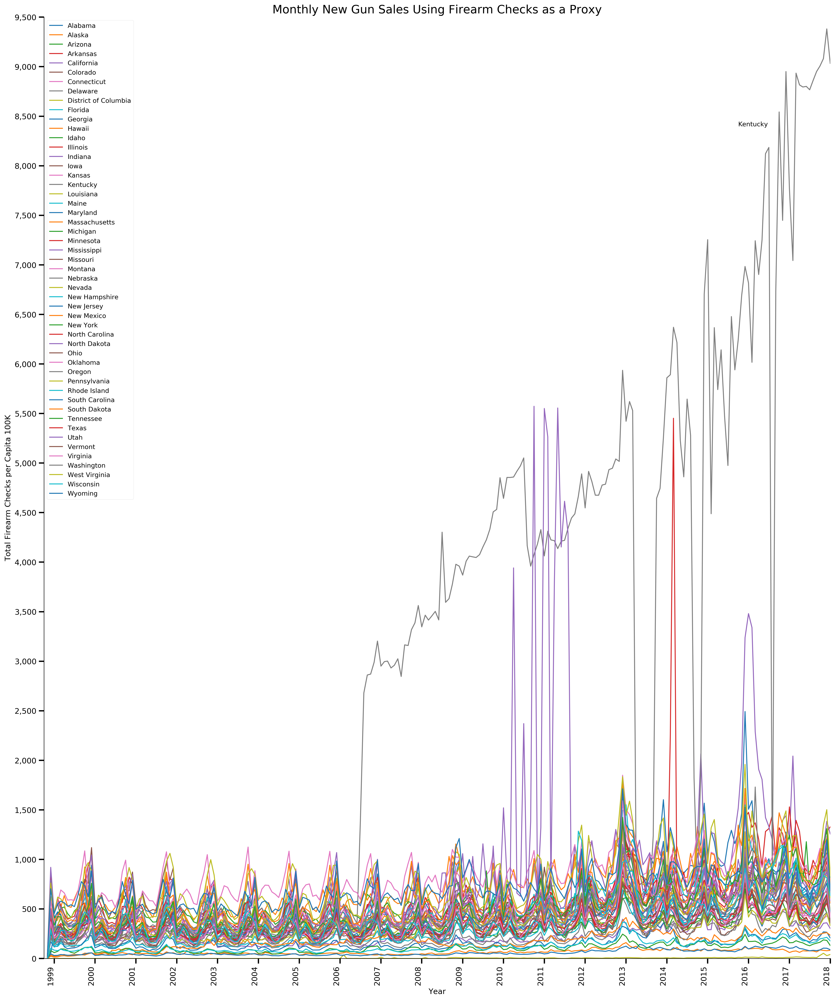

In [34]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline

def graphit(stdz_nics_df, ky_label, y_end, extra):
    fig, ax = plt.subplots(figsize=(22, 30), dpi = 300)  # width, height in inches
    
    # Remove the plot frame lines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    ax.format_xdata = mdates.DateFormatter('%Y')
    ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
    
    for key, group in stdz_nics_df.groupby(['State']):    # Group by State; plot time series of Total
        ax = group.plot(ax=ax, kind='line', x='Month', y='Total', label=key)   # plot_date matplotlib.dates.date2num(d)
    
    ax.legend(loc='best', fancybox=True, framealpha=0.2)
    
    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    yearsFmt = mdates.DateFormatter('%Y')
    
    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    
    # set the range
    ax.set_xlim([datetime.date(1998,10,1), datetime.date(2018,1,1)])
    ax.set_ylim([0, y_end])
    
    ax.tick_params(axis='x',which='both',bottom=True, direction='out', labelbottom=True, 
                   labelsize=12.0, length=8.0, width=2.0, labelrotation=90.0)
    ax.tick_params(axis='y',which='both',left=True, direction='out', labelleft=True, 
                   labelsize=12.0, length=8.0, width=2.0)
    if ky_label:
        plt.text(datetime.date(2015,10,1), 8400, 'Kentucky')  # Insert a label
    
    y_step = 500.0
    if y_end < 1000:
        y_step = 100.0
    
    plt.yticks(np.arange(0, y_end+1.0, y_step))
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(''.join(['Total Firearm Checks per Capita 100K', extra]), fontsize=12)
    plt.title(''.join(['Monthly New Gun Sales Using Firearm Checks as a Proxy', extra]), fontsize=18)  # Standardized NICS data
    
    return plt.show()

ky_label = True
y_end = 9500
extra =''
graphit(std_nics_df, ky_label, y_end, extra)

### Observations from the Plot

There are several spikes in the data. The most prominent is the State of Kentucky (black line).   
The data demonstrates a distinct cyclical nature.   
Following, these observations are discussed in further detail.

### The State of Kentucky   
The graph shows a sudden, huge increase in firearm checks in July 2006 for the state of Kentucky. This is suspicious!   
   
Research into the question revealed the following: In July 2006, Kentucky implemented a new state law that required automatic monthly background checks on every holder of concealed carry permits in the state. Kentucky is the only state with such a policy.
   
Regarding the data, the automatic monthly background checks for existing concealed carry permit holders are **included** in the Total monthly firearm checks. To correct this, subtract out the Permit number from the Total for Kentucky from July 2006 onward.

The computation must select only the State of Kentucky and only the months after July 2006. For the selected data, perform the subtraction, leaving all other data as is. Visualize the methodology.

![Slide3.png](Slide3.png)

In [35]:
# Filter out the data for Kentucky from July 2006 onwards

nics_df.query('state == "Kentucky" & month >= "2006-07-01"').head(10)

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,prepawn_long_gun,prepawn_other,redemption_handgun,redemption_long_gun,redemption_other,returned_handgun,returned_long_gun,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
18,2018-01-01,Kentucky,384989.0,0.0,8202.0,5736.0,323.0,394,0.0,16.0,14.0,0.0,1448.0,1185.0,0.0,18.0,6.0,0.0,0.0,0.0,17.0,25.0,2.0,1.0,0.0,0.0,402376
73,2017-12-01,Kentucky,380648.0,0.0,16727.0,16102.0,502.0,654,8.0,18.0,19.0,0.0,1636.0,1434.0,2.0,11.0,9.0,0.0,0.0,0.0,37.0,29.0,2.0,1.0,2.0,0.0,417841
128,2017-11-01,Kentucky,373308.0,0.0,12568.0,13718.0,365.0,632,3.0,18.0,22.0,0.0,1733.0,2059.0,4.0,4.0,3.0,0.0,0.0,0.0,26.0,40.0,4.0,1.0,0.0,0.0,404508
183,2017-10-01,Kentucky,379403.0,0.0,8758.0,8739.0,371.0,496,0.0,11.0,18.0,0.0,1601.0,1701.0,3.0,5.0,2.0,0.0,0.0,0.0,18.0,28.0,1.0,0.0,0.0,0.0,401155
238,2017-09-01,Kentucky,378384.0,0.0,8112.0,7543.0,253.0,543,1.0,16.0,15.0,0.0,1915.0,1875.0,3.0,1.0,1.0,0.0,0.0,0.0,21.0,19.0,1.0,2.0,1.0,0.0,398706
293,2017-08-01,Kentucky,376016.0,0.0,8039.0,6555.0,244.0,459,0.0,13.0,12.0,0.0,1743.0,1585.0,1.0,5.0,3.0,0.0,0.0,0.0,22.0,14.0,2.0,4.0,0.0,1.0,394718
348,2017-07-01,Kentucky,374603.0,0.0,7236.0,5118.0,241.0,419,0.0,9.0,7.0,0.0,1548.0,1249.0,2.0,7.0,2.0,0.0,0.0,0.0,26.0,25.0,1.0,0.0,0.0,1.0,390494
403,2017-06-01,Kentucky,373842.0,0.0,8765.0,5223.0,265.0,469,0.0,5.0,6.0,1.0,1917.0,1453.0,2.0,4.0,2.0,0.0,0.0,0.0,31.0,17.0,0.0,0.0,0.0,0.0,392002
458,2017-05-01,Kentucky,374078.0,0.0,8690.0,5378.0,223.0,433,0.0,5.0,8.0,0.0,1595.0,1292.0,2.0,4.0,2.0,0.0,0.0,0.0,17.0,9.0,1.0,1.0,2.0,0.0,391740
513,2017-04-01,Kentucky,372852.0,0.0,9858.0,6519.0,257.0,433,0.0,8.0,10.0,1.0,1363.0,1321.0,2.0,13.0,7.0,0.0,0.0,0.0,20.0,21.0,0.0,0.0,0.0,0.0,392685


**<--** _Scroll left to view full table_ **-->**
     
&nbsp;

In [36]:
# Correct the State of Kentucky NICS data
# Subtract 'permit' from 'totals' from July 2006 onward

# nics_df['state'] == 'Kentucky'

original_totals = nics_df['totals'].copy()
nics_ky_df = nics_df.copy()

temp = nics_ky_df.query('state == "Kentucky" & month >= "2006-07-01"')  # Filter out the data
nics_ky_df['totals'] = temp['totals'].subtract(temp['permit'])    # Implement the subtraction and NaNs

nics_ky_df.totals.fillna(original_totals, inplace=True)  # Replace the NaNs with the original data
nics_ky_df.head(20)

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,prepawn_long_gun,prepawn_other,redemption_handgun,redemption_long_gun,redemption_other,returned_handgun,returned_long_gun,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
0,2018-01-01,Alabama,23930.0,0.0,5692.0,6199.0,276.0,288,0.0,12.0,12.0,0.0,1050.0,954.0,1.0,0.0,0.0,0.0,0.0,0.0,22.0,34.0,3.0,2.0,1.0,1.0,38477.0
1,2018-01-01,Alaska,207.0,6.0,1844.0,1621.0,249.0,137,0.0,0.0,0.0,0.0,170.0,124.0,0.0,18.0,15.0,0.0,0.0,0.0,13.0,20.0,5.0,0.0,0.0,0.0,4429.0
2,2018-01-01,Arizona,5686.0,413.0,11659.0,6992.0,1074.0,531,0.0,10.0,5.0,2.0,1357.0,679.0,4.0,154.0,7.0,0.0,0.0,0.0,30.0,14.0,9.0,0.0,1.0,0.0,28627.0
3,2018-01-01,Arkansas,4162.0,555.0,4935.0,5061.0,232.0,323,37.0,7.0,6.0,0.0,955.0,1181.0,2.0,0.0,0.0,0.0,0.0,0.0,13.0,13.0,1.0,0.0,0.0,0.0,17483.0
4,2018-01-01,California,55292.0,0.0,37335.0,22919.0,3495.0,0,0.0,0.0,0.0,0.0,496.0,366.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119910.0
5,2018-01-01,Colorado,9683.0,0.0,17498.0,12153.0,1307.0,1070,0.0,0.0,0.0,0.0,0.0,0.0,0.0,235.0,42.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41989.0
6,2018-01-01,Connecticut,6015.0,503.0,5044.0,1829.0,384.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13775.0
7,2018-01-01,Delaware,639.0,0.0,1422.0,1224.0,91.0,60,0.0,0.0,0.0,0.0,28.0,24.0,2.0,86.0,0.0,0.0,0.0,0.0,61.0,41.0,3.0,2.0,1.0,0.0,3684.0
8,2018-01-01,District of Columbia,206.0,0.0,72.0,4.0,0.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,283.0
9,2018-01-01,Florida,19683.0,0.0,48377.0,20690.0,3299.0,1737,10.0,13.0,4.0,0.0,2866.0,1096.0,2.0,373.0,47.0,2.0,0.0,0.0,33.0,11.0,0.0,0.0,0.0,0.0,98243.0


**<--** _Scroll left to view full table_ **-->**
&nbsp;     
&nbsp;     

In [37]:
# Check the data frame

display(nics_ky_df.iloc[7052:7060, [0,1,2,3,4,5,6,7,26]])
display(nics_ky_df.iloc[7103:7110, [0,1,2,3,4,5,6,7,26]])
display(nics_ky_df.iloc[7152:7160, [0,1,2,3,4,5,6,7,26]])

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,totals
7605,2006-07-01,Indiana,0.0,NaN,4472.0,5443.0,NaN,167,10460.0
7606,2006-07-01,Iowa,2585.0,NaN,16.0,1733.0,NaN,0,4425.0
7607,2006-07-01,Kansas,0.0,NaN,2332.0,2909.0,NaN,121,6005.0
7608,2006-07-01,Kentucky,16783.0,NaN,4945.0,5817.0,NaN,401,41671.0
7609,2006-07-01,Louisiana,0.0,NaN,6136.0,5664.0,NaN,205,13336.0
7610,2006-07-01,Maine,0.0,NaN,932.0,1705.0,NaN,62,2865.0
7612,2006-07-01,Maryland,1639.0,NaN,440.0,2568.0,NaN,4,4753.0
7613,2006-07-01,Massachusetts,6490.0,NaN,1336.0,925.0,NaN,52,8906.0


,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,totals
7660,2006-06-01,Indiana,0.0,NaN,4867.0,5566.0,NaN,187,10988.0
7661,2006-06-01,Iowa,2912.0,NaN,13.0,1775.0,NaN,1,4817.0
7662,2006-06-01,Kansas,0.0,NaN,2150.0,2858.0,NaN,135,5773.0
7663,2006-06-01,Kentucky,0.0,NaN,5389.0,5843.0,NaN,382,14936.0
7664,2006-06-01,Louisiana,0.0,NaN,6190.0,4933.0,NaN,230,12913.0
7665,2006-06-01,Maine,0.0,NaN,1021.0,1751.0,NaN,59,3053.0
7667,2006-06-01,Maryland,2005.0,NaN,440.0,2707.0,NaN,9,5279.0


,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,totals
7713,2006-05-01,Idaho,1192.0,NaN,1356.0,2963.0,NaN,96,6389.0
7714,2006-05-01,Illinois,30029.0,NaN,4622.0,5545.0,NaN,231,40427.0
7715,2006-05-01,Indiana,0.0,NaN,4787.0,5350.0,NaN,203,10675.0
7716,2006-05-01,Iowa,3434.0,NaN,19.0,1769.0,NaN,0,5339.0
7717,2006-05-01,Kansas,0.0,NaN,2370.0,3069.0,NaN,134,6199.0
7718,2006-05-01,Kentucky,0.0,NaN,5315.0,5933.0,NaN,394,17563.0
7719,2006-05-01,Louisiana,0.0,NaN,5627.0,4411.0,NaN,203,11543.0
7720,2006-05-01,Maine,0.0,NaN,970.0,1829.0,NaN,97,3091.0


&nbsp;
Examine the data types and counts.    
&nbsp;    

In [38]:
nics_ky_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11781 entries, 0 to 12704
Data columns (total 27 columns):
month                        11781 non-null datetime64[ns]
state                        11781 non-null object
permit                       11779 non-null float64
permit_recheck               1224 non-null float64
handgun                      11781 non-null float64
long_gun                     11781 non-null float64
other                        5304 non-null float64
multiple                     11781 non-null int64
admin                        11779 non-null float64
prepawn_handgun              9993 non-null float64
prepawn_long_gun             9991 non-null float64
prepawn_other                4947 non-null float64
redemption_handgun           9995 non-null float64
redemption_long_gun          9994 non-null float64
redemption_other             4947 non-null float64
returned_handgun             2244 non-null float64
returned_long_gun            2193 non-null float64
returned_othe

&nbsp;
With the State of Kentucky data corrected, redo the grouping analysis and graphing.    
&nbsp;    

In [39]:
# NICS data, Kentucky fixed: group by year, then by state

group_by_year_state_df = nics_ky_df.groupby([(nics_ky_df['month']).dt.year, 'state'])

list(group_by_year_state_df)[208:209]  # Use list() to display the groups

[((2002, 'California'),
             month       state   permit  permit_recheck  handgun  long_gun  \
  9959  2002-12-01  California  12144.0             NaN  32200.0   28706.0   
  10014 2002-11-01  California  10970.0             NaN  21645.0   22253.0   
  10069 2002-10-01  California  13175.0             NaN  18527.0   21054.0   
  10124 2002-09-01  California  15316.0             NaN  16538.0   20960.0   
  10179 2002-08-01  California  15559.0             NaN  18267.0   22782.0   
  10234 2002-07-01  California  17896.0             NaN  17115.0   19476.0   
  10289 2002-06-01  California  15336.0             NaN  17283.0   19266.0   
  10344 2002-05-01  California  19557.0             NaN  18817.0   19929.0   
  10399 2002-04-01  California  16751.0             NaN  18826.0   20276.0   
  10454 2002-03-01  California  15578.0             NaN  19394.0   23117.0   
  10509 2002-02-01  California  19287.0             NaN  17919.0   19590.0   
  10564 2002-01-01  California  20145.0 

In [40]:
# Check the counts

group_by_year_state_df.count().iloc[202:210, [0,1,2,3,4,5,6,25]]

month  permit  permit_recheck  handgun  long_gun  other  \
month state                                                                 
2001  Wisconsin      12      12               0       12        12      0   
      Wyoming        12      12               0       12        12      0   
2002  Alabama        12      12               0       12        12      0   
      Alaska         12      12               0       12        12      0   
      Arizona        12      12               0       12        12      0   
      Arkansas       12      12               0       12        12      0   
      California     12      12               0       12        12      0   
      Colorado       12      12               0       12        12      0   

                  multiple  totals  
month state                         
2001  Wisconsin         12      12  
      Wyoming           12      12  
2002  Alabama           12      12  
      Alaska            12      12  
      Arizona           12      12  
      Arkansas          12      12  
      California        12      12  
      Colorado          12      12

In [41]:
## Create a new DataFrame for divided NICS data, Kentucky corrected

std_nics_df = standardize(group_by_year_state_df)

display(std_nics_df[1984:2000])
display (std_nics_df[4588:4604])

,Month,State,Handgun,Long Gun,Total
10,2002-02-01,Arkansas,129.160912,219.739853,507.182936
11,2002-01-01,Arkansas,101.148331,209.761756,451.822980
0,2002-12-01,California,92.338108,82.318563,209.484196
1,2002-11-01,California,62.070135,63.813662,157.341842
2,2002-10-01,California,53.128824,60.375358,151.285379
3,2002-09-01,California,47.425082,60.105799,151.643835
4,2002-08-01,California,52.383237,65.330645,162.368820
5,2002-07-01,California,49.079712,55.850217,156.252137
6,2002-06-01,California,49.561476,55.248012,148.790530
7,2002-05-01,California,53.960440,57.149259,167.192196


,Month,State,Handgun,Long Gun,Total
10,2006-02-01,Kansas,103.585649,172.534168,318.357570
11,2006-01-01,Kansas,102.101717,197.471453,335.513265
0,2006-12-01,Kentucky,221.295831,481.840446,782.131564
1,2006-11-01,Kentucky,141.945028,357.979247,599.444592
2,2006-10-01,Kentucky,138.413586,288.938361,509.309854
3,2006-09-01,Kentucky,134.431825,235.658610,468.520508
4,2006-08-01,Kentucky,127.819258,191.456327,398.981902
5,2006-07-01,Kentucky,117.201230,137.868464,987.642558
6,2006-06-01,Kentucky,127.724455,138.484689,353.997486
7,2006-05-01,Kentucky,125.970584,140.617775,416.259899


   
Review the summary statistics.
      

In [42]:
std_nics_df.describe()

,Handgun,Long Gun,Total
count,11781.000000,11781.000000,11781.000000
mean,127.231984,183.108150,420.919058
std,105.463740,136.332891,303.051748
min,0.000000,0.000000,0.000000
25%,53.789534,87.886543,227.635309
50%,106.696221,150.550995,366.226619
75%,179.557719,246.394323,553.710855
max,981.372780,1070.172573,5572.631033


   
The numbers in the **Total** column are looking much more reasonable. The maximum value has dropped dramatically.   
   

### Graph   
Examine the corrected data in a time series plot of the standardized total firearm checks per state.   
   
### Method   
- Group the standardized firearm check data by State
- Plot the time series of total firearm checks for each state
   

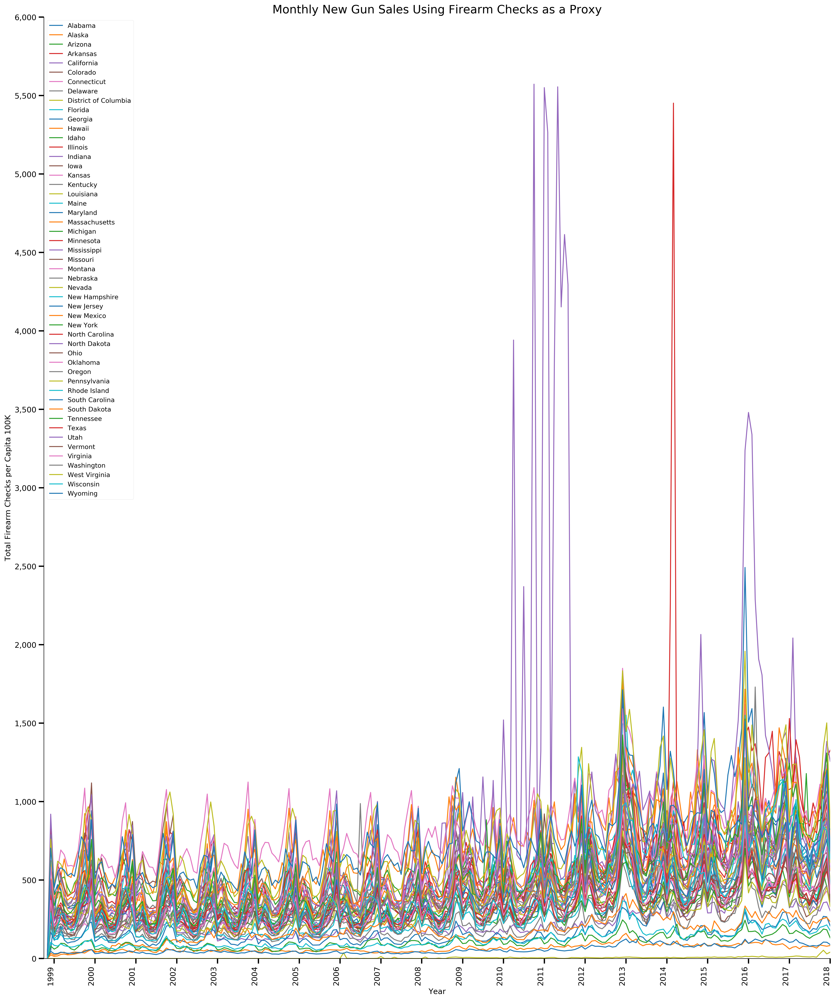

In [43]:
# MatPlotLib

ky_label = False
y_end = 6000
extra = ''
graphit(std_nics_df, ky_label, y_end, extra)  # Plot the graph

## Observations from the Plot   
The State of Kentucky is corrected and is no longer conspicuous. There are a few spikes in the data that are investigated next.


### Spikes   
During 2010 and 2011, Utah (purple line) relaxed its state laws regarding gun ownership, concealed carry, and types of firearms allowed. People went out and bought guns.   

In June 2014, North Carolina (red line) repealed its firearm registration law.   

At the beginning of 2016, Indiana (second purple line) eased its gun carry law.  

### Trends    
A distinct cyclical, seasonal trend is observed. This is Black Friday, the day after Thanksgiving when all the retailers offer large discounts.

When state gun laws change, sales of firearms are affected. People purchase before restrictions are implemented, or after laws are loosened.

Mass shootings and terrorist attacks also affect firearm sales.

There is a very slight overall upward trend indicative of market growth (at a low rate).

# Sorting the Data
Run data sorts to analyze how many guns are sold per capita in the different states over the full time period.

In [44]:
# For all the months, sort by Total

std_nics_df.loc[:, ['Month', 'State', 'Total']].sort_values('Total', ascending=False, 
                                                                              inplace=False, kind='quicksort', 
                                                                              na_position='last')[0:20]

,Month,State,Total
2,2010-10-01,Utah,5572.631033
7,2011-05-01,Utah,5555.634486
11,2011-01-01,Utah,5550.590851
9,2014-03-01,North Carolina,5451.858737
10,2011-02-01,Utah,5264.630980
5,2011-07-01,Utah,4614.286272
4,2011-08-01,Utah,4294.583776
6,2011-06-01,Utah,4153.077860
8,2010-04-01,Utah,3941.648710
8,2011-04-01,Utah,3795.441549


Utah sold the most guns per capita in a month when its gun laws changed to ease restrictions.

In [45]:
# For all the months, sort by Long Gun

std_nics_df.loc[:, ['Month', 'State', 'Long Gun']].sort_values('Long Gun', ascending=False, 
                                                                              inplace=False, kind='quicksort', 
                                                                              na_position='last')[0:10]

,Month,State,Long Gun
0,2012-12-01,South Dakota,1070.172573
0,2012-12-01,West Virginia,979.270869
0,2012-12-01,North Dakota,901.651031
2,1999-10-01,Montana,889.690398
0,2012-12-01,Montana,888.769753
0,2012-12-01,Alabama,881.459825
2,2012-10-01,North Dakota,878.981437
0,2012-12-01,Alaska,862.586803
2,2012-10-01,South Dakota,854.336421
2,2001-10-01,Montana,847.114705


The most rifles per capita sold in a month were in the Dakotas and Montana.

In [46]:
# For all the months, sort by Handgun

std_nics_df.loc[:, ['Month', 'State', 'Handgun']].sort_values('Handgun', ascending=False, inplace=False, 
                                                              kind='quicksort', na_position='last')[0:10]

,Month,State,Handgun
0,2015-12-01,Alabama,981.372780
0,2015-12-01,West Virginia,819.669012
0,2015-12-01,Tennessee,787.819126
0,2015-12-01,Oklahoma,727.085896
0,2012-12-01,Wyoming,720.940396
0,2015-12-01,New Hampshire,716.995431
0,2015-12-01,Alaska,713.434935
0,2015-12-01,Missouri,713.034199
0,2012-12-01,Alaska,708.651182
0,2015-12-01,Pennsylvania,704.042897


The most handguns per capita sold in a month were in Alabama.

## Sorting through the Entire Time Series for Most New Guns Sold
The most new guns per capita sold in a given month were in Utah after the state firearm laws were relaxed. A total of 5572 firearms per capita 100K were sold at the end of year 2010. That equates to 0.06 new guns sold per person, or one new gun per 18 people.   

Sales of rifles (long guns) are higher than handguns and the most sold were in South Dakota and Alabama respectively, during Black Friday 2012 and 2015.

  Firearm Type | Number of People per One New Gun
  -|-
  Total        |       18        
  Long Gun     |       93        
  Handgun      |      102        


   
# The Top 3 and Bottom 3 States for New Gun Sales by Gun Type   
### Method   
- Group the standardized NICS data by month   
- For each month, sort the states by total
- Merge the monthly column series to build a data frame
- Sort for total firearm checks, long guns, and handguns

In [47]:
# Perform a sort to find the top 3 and bottom 3 states for each month
# Sorted by Total

# std_nics_df = pd.DataFrame(index = pd.Series(range(0,12)), columns = ['Month', 'State', 'Handgun', 'Long Gun', 'Total'])

std_nics_month_df = std_nics_df.groupby('Month')
# list(std_nics_month_df)  # Use list() to display the groups

def sort_by_month(to_sort):
    f_result_df = pd.DataFrame(index = range(0,50), columns = [])
    the_series = pd.DataFrame(columns = [])
    f_top_3 = pd.Series([])
    f_bottom_3 = pd.Series([])
    
    sorted = pd.DataFrame
    
    for name, group in std_nics_month_df:   # Group by month
        sorted = group.loc[:, ['State', to_sort]].sort_values(to_sort, ascending=False, inplace=False, kind='quicksort', 
                                                              na_position='last')[0:50]  # For each month sort States by Total                                                    
        
        the_series = pd.DataFrame(sorted['State'])
        the_series.index = range(0,50)
        the_series.columns = [name.strftime("%Y-%m")]
        
        f_result_df = f_result_df.merge(the_series, left_index=True, right_index=True, how='outer')  # Build the Data Frame
        
        # pandas range start and stop ARE included
        f_top_3 = f_top_3.append(f_result_df[name.strftime("%Y-%m")][0:2], ignore_index=True)
        f_bottom_3 = f_bottom_3.append(f_result_df[name.strftime("%Y-%m")][48:50], ignore_index=True)
        
    f_top_3 = f_top_3.unique()
    f_bottom_3 = f_bottom_3.unique()
    
    return (f_result_df, f_top_3, f_bottom_3)  # return tuple

t = sort_by_month('Total')
result_df = t[0]
top_3 = t[1]
bottom_3 = t[2]

pd.set_option('display.max_columns', 500)
print (top_3.tolist())
result_df.loc[0:2, :]

['Mississippi', 'Alabama', 'Arkansas', 'Montana', 'Colorado', 'West Virginia', 'Alaska', 'Wyoming', 'South Dakota', 'Kentucky', 'Utah', 'Tennessee', 'Iowa', 'North Dakota', 'Wisconsin', 'New Hampshire', 'Illinois', 'North Carolina', 'Indiana', 'Washington', 'Minnesota', 'Idaho']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
0,Mississippi,Mississippi,Montana,West Virginia,Montana,Montana,Montana,Montana,Alaska,Alaska,Montana,Montana,West Virginia,Colorado,Colorado,West Virginia,Montana,Montana,Montana,Montana,Alaska,Montana,Montana,Montana,West Virginia,Colorado,Colorado,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,West Virginia,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Mississippi,Montana,Montana,Montana,Montana,Montana,Montana,Kentucky,Montana,Montana,Montana,West Virginia,Mississippi,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Utah,Utah,Alaska,Montana,Alaska,Wyoming,Utah,Wyoming,Wyoming,Utah,Montana,Montana,Utah,Tennessee,Montana,Utah,West Virginia,West Virginia,Utah,Montana,Montana,Utah,Alaska,Montana,Utah,Montana,Utah,Utah,West Virginia,Utah,Utah,Utah,Montana,Utah,Utah,Utah,Utah,Utah,Montana,Montana,Wisconsin,West Virginia,Montana,West Virginia,North Dakota,Alaska,Montana,Montana,Montana,Montana,Montana,North Dakota,West Virginia,Montana,New Hampshire,West Virginia,West Virginia,Alaska,Utah,Utah,Utah,Utah,Montana,Montana,West Virginia,Alabama,Alabama,North Carolina,North Carolina,Alaska,Alaska,Illinois,Alabama,Alaska,Montana,Alaska,Indiana,Alabama,Alabama,West Virginia,West Virginia,Indiana,Indiana,Indiana,Alabama,Alabama,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Indiana,Illinois,Montana,South Dakota,Indiana,West Virginia,Minnesota,Indiana,Minnesota,Minnesota,Minnesota,Idaho,Alaska,Illinois,Montana,Montana,West Virginia,West Virginia,Illinois
1,Alabama,Arkansas,Colorado,Arkansas,West Virginia,Alaska,Alaska,Wyoming,Montana,Montana,Wyoming,Alaska,Arkansas,Mississippi,Wyoming,

**<--** _Scroll left to view full table_ **-->**    
&nbsp;    

In [48]:
# Bottom 3 states by Total

print (bottom_3.tolist())  # Sorted by 'Total'
result_df.loc[47:50, :]

['South Carolina', 'Pennsylvania', 'Hawaii', 'Massachusetts', 'New Jersey', 'Rhode Island', 'New York', 'District of Columbia']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
47,Illinois,New Jersey,New Jersey,New Jersey,New Jersey,Hawaii,New Jersey,Hawaii,Hawaii,Hawaii,Hawaii,Massachusetts,New Jersey,New Jersey,Hawaii,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New York,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,Rhode Island,New York,New York,New York,New York,New York,Massachusetts,Massachusetts,Rhode Island,Rhode Island,New York,New York,New York,Hawaii,Rhode Island,New York,Hawaii,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,New York,Hawaii,New York,New York,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,New York,Hawaii,New York,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,Hawaii,New York,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,Rhode Island,New York,New York,New York,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,New York,New York,New York,New York,Rhode Island,Rhode Island,Rhode Island,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,Rhode Island,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New Jersey,New Jersey,New Jersey,New York,New York,New York,New York,New York,New York,New York,New York,Rhode Island,New York,Rhode Island,Maryland,New York,Maryland,Maryland,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New York,New 

**<--** _Scroll left to view full table_ **-->**    

## Count the Frequency of the States in the Top and Bottom Ranks
Count the number of months each state ranks in the top 3 or bottom 3.

In [49]:
# Perform a count for the top 3 states
# How many months does the state rank in the top 3
# Sorted by Total

from collections import Counter
z = result_df[0:2].values.flatten().tolist()
top_3_total = Counter(z).most_common()
top_3_total

[('Montana', 152),
 ('West Virginia', 63),
 ('Alaska', 50),
 ('Wyoming', 43),
 ('Utah', 26),
 ('Indiana', 24),
 ('Alabama', 22),
 ('Illinois', 15),
 ('South Dakota', 14),
 ('Mississippi', 13),
 ('Colorado', 13),
 ('Arkansas', 7),
 ('North Dakota', 4),
 ('Minnesota', 4),
 ('Tennessee', 3),
 ('North Carolina', 2),
 ('Wisconsin', 2),
 ('Washington', 1),
 ('New Hampshire', 1),
 ('Idaho', 1),
 ('Kentucky', 1),
 ('Iowa', 1)]

In [50]:
# Perform a count for the bottom 3 states
# How many months does the state rank in the bottom 3
# Sorted by Total

from collections import Counter
z = result_df[47:50].values.flatten().tolist()
bottom_3_total = Counter(z).most_common()
bottom_3_total

[('New Jersey', 229),
 ('Hawaii', 229),
 ('New York', 154),
 ('Rhode Island', 54),
 ('Massachusetts', 20),
 ('Maryland', 3),
 ('South Carolina', 1),
 ('District of Columbia', 1),
 ('Illinois', 1),
 ('Pennsylvania', 1)]

In [51]:
# Perform a sort to find the top 3 and bottom 3 states for each month
# Sorted by Long Gun

t = sort_by_month('Long Gun')
result_df = t[0]
top_3 = t[1]
bottom_3 = t[2]

pd.set_option('display.max_columns', 500)
print (top_3.tolist())
result_df.loc[0:2, :]

['Mississippi', 'Arkansas', 'Montana', 'West Virginia', 'Pennsylvania', 'Alaska', 'Wyoming', 'North Dakota', 'South Dakota', 'Colorado']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
0,Mississippi,Mississippi,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Alaska,Montana,Montana,West Virginia,Arkansas,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Mississippi,Montana,West Virginia,Montana,Montana,Montana,Montana,Montana,Montana,Montana,Montana,West Virginia,Colorado,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Montana,Pennsylvania,Montana,Montana,South Dakota,West Virginia,Mississippi,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Montana,Montana,South Dakota,South Dakota,South Dakota,West Virginia,Mississippi,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Montana,Montana,Montana,South Dakota,South Dakota,West Virginia,South Dakota,South Dakota,South Dakota,Montana,Montana,Montana,Montana,Montana,Alaska,South Dakota,South Dakota,Mississippi,Mississippi,South Dakota,South Dakota,Montana,Montana,Montana,Montana,Montana,Montana,South Dakota,South Dakota,South Dakota,Mississippi,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Montana,Pennsylvania,Montana,South Dakota,South Dakota,South Dakota,Mississippi,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Montana,Alaska,South Dakota,South Dakota,South Dakota,South Dakota,South Dakota,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,Montana,Montana,Pennsylvania,Montana,South Dakota,South Dakota,South Dakota,South Dakota,Pennsylvania,Pennsylvania,Pennsylvania,Alaska,Alaska,Montana,Pennsylvania,Alaska,South Dakota,South Dakota,South Dakota,South Dakota,Pennsylvania,Pennsylvania,Pennsylvania,Alaska,Pennsylvania,Pennsylvania,Pennsylvania,Alaska,North Dakota,North Dakota,West Virginia,West Virginia,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,Pennsylvania,North Dakota,North Dakota,South Dakota,South Dakota,Pennsylvania,Pennsylvania,Pennsylvania,Alaska,Alaska,Pennsylvania,Alaska,Alaska,North Dakota,North Dakota,West Virginia,West Virginia,South Dakota,South Dakota,South Dakota,Alaska,Alaska,Montana,Alaska,Alaska,South Dakota,South Dakota,West Virginia,South Dakota,South Dakota,South Dakota,South Dakota,Mo

**<--** _Scroll left to view full table_ **-->**    
&nbsp;    

In [52]:
# Bottom 3 states by Long Gun

print (bottom_3.tolist())  # Sorted by Long Gun
result_df.loc[47:50, :]

['Pennsylvania', 'Virginia', 'Massachusetts', 'Hawaii', 'District of Columbia', 'Connecticut', 'New Jersey']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
47,Hawaii,Georgia,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,New Jersey,Massachusetts,Massachusetts,New Jersey,New Jersey,New Jersey,Massachusetts,Massachusetts,New Jersey,Massachusetts,Massachusetts,Massachusetts,New Jersey,Massachusetts,New Jersey,New Jersey,New Jersey,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New Jersey,New Jersey,Massachusetts,Massachusetts,New Jersey,New Jersey,Massachusetts,Rhode Island,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New Jersey,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New Jersey,New Jersey,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,New Jersey,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachusetts,Massachu

**<--** _Scroll left to view full table_ **-->**    
&nbsp;    

In [53]:
# Perform a count for the top 3 states
# How many months does the state rank in the top 3
# Sorted by Long Gun

from collections import Counter
z = result_df[0:2].values.flatten().tolist()
top_3_long_gun = Counter(z).most_common()
top_3_long_gun

[('Montana', 132),
 ('South Dakota', 102),
 ('Pennsylvania', 71),
 ('Alaska', 54),
 ('West Virginia', 39),
 ('North Dakota', 20),
 ('Wyoming', 16),
 ('Mississippi', 16),
 ('Arkansas', 10),
 ('Colorado', 2)]

In [54]:
# Perform a count for the bottom 3 states
# How many months does the state rank in the bottom 3
# Sorted by Long Gun

from collections import Counter
z = result_df[47:50].values.flatten().tolist()
bottom_3_long_gun = Counter(z).most_common()
bottom_3_long_gun

[('Massachusetts', 229),
 ('New Jersey', 209),
 ('District of Columbia', 181),
 ('Hawaii', 52),
 ('Connecticut', 17),
 ('Georgia', 1),
 ('Virginia', 1),
 ('Rhode Island', 1),
 ('Pennsylvania', 1),
 ('New York', 1)]

In [55]:
# Perform a sort to find the top 3 states for each month
# Sorted by Handgun

t = sort_by_month('Handgun')
result_df = t[0]
top_3 = t[1]
bottom_3 = t[2]

pd.set_option('display.max_columns', 500)
print (top_3.tolist())
result_df.loc[0:2, :]

['Alaska', 'Montana', 'Kentucky', 'Mississippi', 'Colorado', 'Wyoming', 'West Virginia', 'Tennessee', 'Alabama', 'Louisiana', 'Missouri', 'Oklahoma', 'New Hampshire', 'Virginia', 'Maryland', 'Pennsylvania', 'Illinois']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
0,Alaska,Kentucky,Colorado,Mississippi,Mississippi,Alaska,Wyoming,Alaska,Alaska,Colorado,Colorado,Alaska,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Alaska,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Colorado,Kentucky,West Virginia,West Virginia,Montana,Montana,Alaska,Montana,Alaska,Montana,Alaska,West Virginia,West Virginia,Kentucky,Tennessee,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Montana,Alaska,Kentucky,Wyoming,Kentucky,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Wyoming,Kentucky,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Louisiana,Alaska,Alaska,Alaska,Louisiana,Mississippi,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Wyoming,Alaska,Alaska,Alaska,Alabama,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Missouri,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Wyoming,Wyoming,Wyoming,Wyoming,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Tennessee,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Oklahoma,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,West Virginia,Oklahoma,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Alaska,Oklahoma,Wyoming,Wyoming,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Maryland,Alaska,Alaska,West Virginia,West Virginia,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alaska,Pennsylvania,Alaska,Pennsylvania,Alaska,West Virginia,West Virginia,West Virginia,Alaska,Alaska,Alaska,Alaska,Alabama,Louisiana,Alaska,Pennsylvania,Alabama,New Hampshire,Alabama,West Virginia,Alaska,Alaska,Alaska,Louisiana,Illinois,New Hampshire,Alaska,Pennsylvania,West Virginia,New Hampshire,West Virginia,New Hampshire,New Hampshire,Alaska,Alaska,Alaska,Alaska,New Hampshire,Alaska,Tennessee,West Virginia,New Hampshire
1,Montana,Mississippi,Kentucky,Kentucky,Kentucky,Wyoming,Montana,Wyoming,Mississippi,Wyoming,Montana,Colorado,Kentucky,Kentucky,Kentucky,Missi

**<--** _Scroll left to view full table_ **-->**    
&nbsp;    

In [56]:
# Bottom 3 states by Handgun

print (bottom_3.tolist())  # Sorted by Handgun
result_df.loc[47:50, :]

['South Carolina', 'Hawaii', 'Pennsylvania', 'District of Columbia', 'Michigan', 'Connecticut', 'Nebraska', 'Maryland', 'Iowa', 'North Carolina']


,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01
47,District of Columbia,Michigan,Michigan,Michigan,Iowa,Michigan,Michigan,Michigan,Michigan,Michigan,Michigan,Michigan,Iowa,Michigan,District of Columbia,District of Columbia,District of Columbia,District of Columbia,District of Columbia,Pennsylvania,District of Columbia,District of Columbia,Pennsylvania,District of Columbia,District of Columbia,Pennsylvania,Connecticut,District of Columbia,District of Columbia,District of Columbia,District of Columbia,Connecticut,Pennsylvania,Connecticut,Iowa,Iowa,Nebraska,Iowa,Iowa,Iowa,Nebraska,Nebraska,Iowa,Nebraska,Maryland,Iowa,Iowa,Iowa,Nebraska,Iowa,Iowa,Nebraska,Nebraska,Iowa,Iowa,Nebraska,District of Columbia,Iowa,Iowa,Iowa,Iowa,Maryland,Nebraska,Nebraska,Maryland,Iowa,Iowa,Nebraska,Nebraska,Maryland,Nebraska,Iowa,Nebraska,Nebraska,District of Columbia,Pennsylvania,District of Columbia,District of Columbia,District of Columbia,District of Columbia,District of Columbia,Pennsylvania,District of Columbia,District of Columbia,District of Columbia,District of Columbia,District of Columbia,Iowa,Iowa,Iowa,District of Columbia,Iowa,Pennsylvania,Iowa,District of Columbia,District of Columbia,District of Columbia,Iowa,Iowa,District of Columbia,District of Columbia,District of Columbia,Iowa,Iowa,Iowa,District of Columbia,District of Columbia,Iowa,District of Columbia,District of Columbia,Nebraska,Nebraska,Nebraska,Nebraska,Nebraska,Nebraska,Nebraska,Nebraska,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,North Carolina,Iowa,North Carolina,North Carolina,North Carolina,District of Columbia,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Iowa,Nebraska,District of Columbia,Nebraska,District of Columbia,District of Columbia,Nebraska,Nebraska,Nebraska,Nebraska,District of Columbia,District of Columbia,Nebraska,Nebraska,Nebraska,Nebraska,Nebraska,District of Columbia,Nebraska,Nebraska,Iowa,District of Columbia,Nebraska,Iowa,Iowa,Iowa,Iowa,Nebraska,Nebraska,Nebraska,District of Columbia,District of Columbia,District of Columbi

**<--** _Scroll left to view full table_ **-->**    
&nbsp;    

In [57]:
# Perform a count for the top 3 states
# How many months does the state rank in the top 3
# Sorted by Handgun

from collections import Counter
z = result_df[0:2].values.flatten().tolist()
top_3_handgun = Counter(z).most_common()
top_3_handgun

[('Alaska', 151),
 ('West Virginia', 60),
 ('Wyoming', 56),
 ('Montana', 42),
 ('Colorado', 34),
 ('Kentucky', 23),
 ('Pennsylvania', 20),
 ('Alabama', 16),
 ('Tennessee', 14),
 ('New Hampshire', 14),
 ('Mississippi', 10),
 ('Oklahoma', 9),
 ('Louisiana', 7),
 ('Missouri', 3),
 ('Virginia', 1),
 ('Maryland', 1),
 ('Illinois', 1)]

In [58]:
# Perform a count for the bottom 3 states
# How many months does the state rank in the bottom 3
# Sorted by Handgun

from collections import Counter
z = result_df[47:50].values.flatten().tolist()
bottom_3_handgun = Counter(z).most_common()
bottom_3_handgun

[('Pennsylvania', 168),
 ('District of Columbia', 145),
 ('Iowa', 142),
 ('Nebraska', 134),
 ('Hawaii', 51),
 ('Connecticut', 19),
 ('North Carolina', 16),
 ('Michigan', 12),
 ('Maryland', 5),
 ('South Carolina', 1)]

## Graphs
View the data in a time series plot of the standardized total firearm checks per state.

The Top 7 States by Total are:
['Montana', 'West Virginia', 'Alaska', 'Wyoming', 'Utah', 'Indiana', 'Alabama']

           Handgun     Long Gun        Total
count  1617.000000  1617.000000  1617.000000
mean    200.899238   298.736651   705.347489
std     116.781434   153.256633   457.194324
min       2.115912     3.707079     5.873773
25%     124.026950   176.337202   451.169016
50%     175.459569   282.244092   651.106769
75%     259.059119   388.652612   880.129132
max     981.372780   979.270869  5572.631033


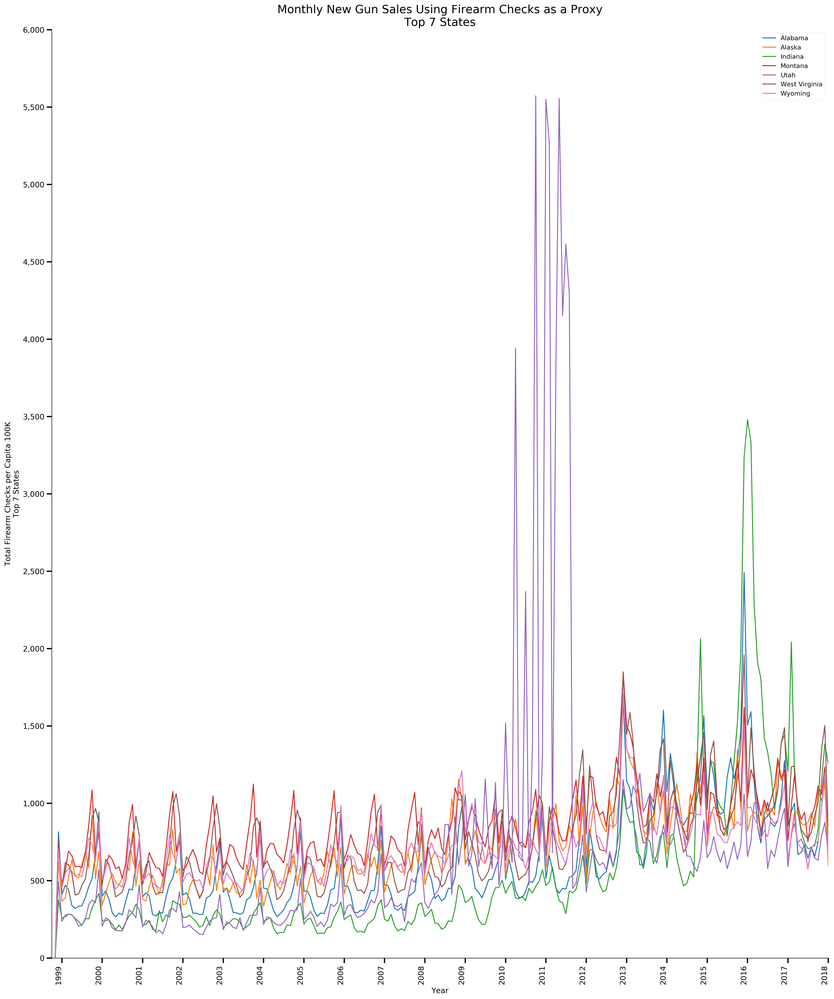

In [59]:
# Graphical plots of Top 7 states by Total

top_set = [ ]
for element in top_3_total:
    top_set.append(element[0])

print ('The Top 7 States by Total are:')
print (top_set[0:7])
print ()

df_top = pd.DataFrame

df_top = std_nics_df[std_nics_df['State'].isin(top_set[0:7])]    # Selects all the TRUE rows --> returns a DataFrame

print (df_top.describe())

# MatPlotLib

ky_label = False
y_end = 6000
extra = '\nTop 7 States'
graphit(df_top, ky_label, y_end, extra)  # Plot the graph

## Observations from the Plot   
The Top 7 States mimic the graph of all the states.

Notable, are the strong spikes in the State of Utah data (purple line). During 2010 and 2011, Utah relaxed its state laws regarding gun ownership, concealed carry, and types of firearms allowed. When state gun laws change, sales of firearms are affected. People purchase before restrictions are implemented, or after laws are loosened.

At the beginning of 2016, Indiana (green line) eased its gun carry law.

**All Top 7 States spike in January 2013:** 
 The Assault Weapons Ban of 2013 was a bill introduced into Congress by Senator Dianne Feinstein in January 2013, one month after the Sandy Hook Elementary School shooting. It was defeated in the US Senate in April 2013.

### Trends   
A clear cyclical, seasonal trend is observed. This is Black Friday, the day after Thanksgiving when all the retailers offer large discounts.

There is a slight overall upward trend indicative of market growth (at a low rate).   


The Bottom 6 States by Total are:
['New Jersey', 'Hawaii', 'New York', 'Rhode Island', 'Massachusetts', 'Maryland']

           Handgun     Long Gun        Total
count  1386.000000  1386.000000  1386.000000
mean     33.422932    41.897192   113.754653
std      36.109730    33.261700    69.803702
min       0.000000     0.000000     0.699823
25%       4.257196    18.936327    61.817794
50%      26.382601    36.526879    97.379126
75%      49.975764    60.761234   148.736244
max     641.449847   187.484724   836.792437


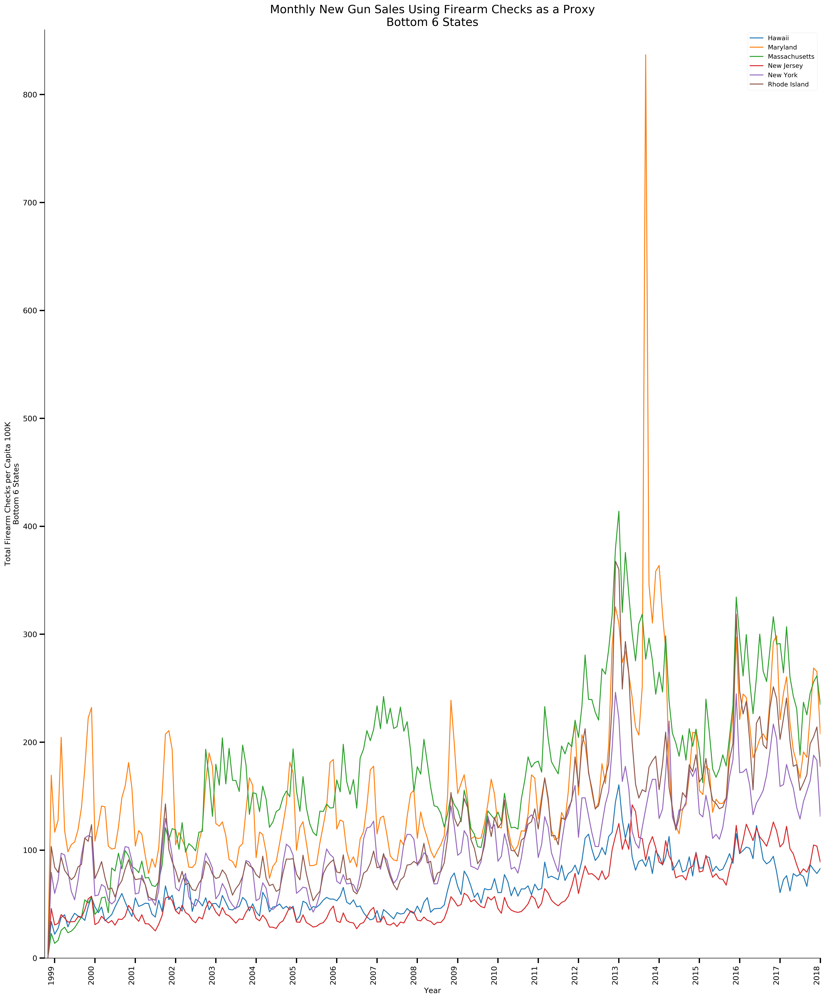

In [60]:
# Graphical plots of Bottom 6 states by Total

bottom_set = [ ]
for element in bottom_3_total:
    bottom_set.append(element[0])

print ('The Bottom 6 States by Total are:')
print (bottom_set[0:6])
print ()

df_bottom = pd.DataFrame

df_bottom = std_nics_df[std_nics_df['State'].isin(bottom_set[0:6])]    # Selects all the TRUE rows --> returns a DataFrame

print (df_bottom.describe())

# MatPlotLib

ky_label = False
y_end = 860
extra = '\nBottom 6 States'
graphit(df_bottom, ky_label, y_end, extra)  # Plot the graph

## Observations from the Plot   
There are two spikes in the data, the State of Maryland (orange line), and the Assault Weapons Bill of January 2013, as explained below.

### Spikes
**State of Maryland:** 
 In May 2013, Maryland State Law imposed significant new restrictions on gun ownership. People purchased guns before the new laws went into effect.

**All Bottom 6 States spike in January 2013:** 
 The Assault Weapons Ban of 2013 was a bill introduced into Congress in January 2013, one month after the Sandy Hook Elementary School shooting. It was defeated in the US Senate in April 2013.

### Trends    
In the states that sell fewer guns per capita (bottom states), the cyclical, seasonal trend is muted.

## The Top 3 and Bottom 3 States for Gun Sales per capita and Type of Firearm Purchased

Plot bar charts to visually examine the results.   

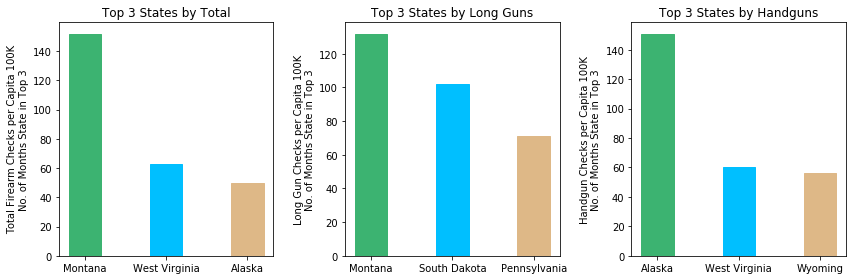

In [61]:
import matplotlib.pyplot as plt

top_total_names = [ ]
top_total_values = [ ]

top_long_gun_names = [ ]
top_long_gun_values = [ ]

top_handgun_names = [ ]
top_handgun_values = [ ]

def top_gun(top_tuple ,names, vals):
    
    for element in top_tuple:
        names.append(element[0])
        vals.append(element[1])
    
    return

top_gun(top_3_total[0:3], top_total_names, top_total_values)
top_gun(top_3_long_gun[0:3], top_long_gun_names, top_long_gun_values)
top_gun(top_3_handgun[0:3], top_handgun_names, top_handgun_values)
   
ind = [0,1,2]     # the x locations for the groups
width = 0.4       # the width of the bars

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), sharex=False, sharey=False)
rects1 = ax1.bar(ind, top_total_values, width, align='center')
rects2 = ax2.bar(ind, top_long_gun_values, width, align='center')
rects3 = ax3.bar(ind, top_handgun_values, width, align='center')

def bar_color(bars):
    bars[0].set_color('mediumseagreen')
    bars[1].set_color('deepskyblue')
    bars[2].set_color('burlywood')
    return
    
bar_color(rects1)
bar_color(rects2)
bar_color(rects3)

def chart_axis(axit, yit, ti, lab):           # add text for labels, title and axes ticks
    axit.set_ylabel(yit)
    axit.set_title(ti)
    axit.set_xticks(ind)
    axit.set_xticklabels(lab)
    return

chart_axis(ax1, 'Total Firearm Checks per Capita 100K\nNo. of Months State in Top 3', 'Top 3 States by Total', top_total_names)
chart_axis(ax2, 'Long Gun Checks per Capita 100K\nNo. of Months State in Top 3', 'Top 3 States by Long Guns', top_long_gun_names)
chart_axis(ax3, 'Handgun Checks per Capita 100K\nNo. of Months State in Top 3', 'Top 3 States by Handguns', top_handgun_names)

print ()
fig.tight_layout()
plt.show()
print ()

## Observations from the Charts

Notice the vertical axis is the number of months (frequency) the state was in the top or bottom three states.   
The States of Montana, West Virginia, and Alaska stand out in the top 3.
   

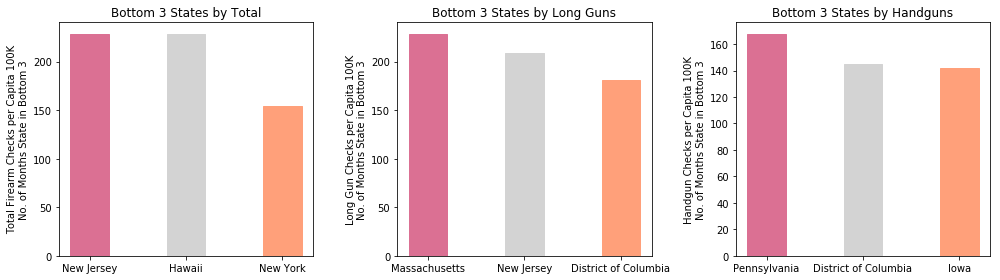

In [62]:
bottom_total_names = [ ]
bottom_total_values = [ ]

bottom_long_gun_names = [ ]
bottom_long_gun_values = [ ]

bottom_handgun_names = [ ]
bottom_handgun_values = [ ]

def bottom_gun(bottom_tuple ,names, vals):
    
    for element in bottom_tuple:
        names.append(element[0])
        vals.append(element[1])
    
    return

bottom_gun(bottom_3_total[0:3], bottom_total_names, bottom_total_values)
bottom_gun(bottom_3_long_gun[0:3], bottom_long_gun_names, bottom_long_gun_values)
bottom_gun(bottom_3_handgun[0:3], bottom_handgun_names, bottom_handgun_values)
   
ind = [0,1,2]     # the x locations for the groups
width = 0.4       # the width of the bars

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(14, 4), sharex=False, sharey=False)
rects1 = ax1.bar(ind, bottom_total_values, width, align='center')
rects2 = ax2.bar(ind, bottom_long_gun_values, width, align='center')
rects3 = ax3.bar(ind, bottom_handgun_values, width, align='center')

def bar_color(bars):
    bars[0].set_color('palevioletred')
    bars[1].set_color('lightgray')
    bars[2].set_color('lightsalmon')
    return
    
bar_color(rects1)
bar_color(rects2)
bar_color(rects3)

def chart_axis(axit, yit, ti, lab):           # add text for labels, title and axes ticks
    axit.set_ylabel(yit)
    axit.set_title(ti)
    axit.set_xticks(ind)
    axit.set_xticklabels(lab)
    return

chart_axis(ax1, 'Total Firearm Checks per Capita 100K\nNo. of Months State in Bottom 3', 'Bottom 3 States by Total', bottom_total_names)
chart_axis(ax2, 'Long Gun Checks per Capita 100K\nNo. of Months State in Bottom 3', 'Bottom 3 States by Long Guns', bottom_long_gun_names)
chart_axis(ax3, 'Handgun Checks per Capita 100K\nNo. of Months State in Bottom 3', 'Bottom 3 States by Handguns', bottom_handgun_names)

print ()
fig.tight_layout()
plt.show()
print ()

## Observations from the Charts

The State of New Jersey and District of Columbia (Washington, DC) stand out in the bottom 3.
   

In [63]:
# Filter out the data for Montana -- the top gun state

std_nics_df.query('State == "Montana" ').describe()

,Handgun,Long Gun,Total
count,231.000000,231.000000,231.000000
mean,211.147819,437.385463,854.049624
std,81.058798,124.615533,226.779841
min,11.483367,11.142277,22.853037
25%,153.090896,351.974535,686.223716
50%,190.349010,404.857841,832.332299
75%,252.762901,507.256621,994.643752
max,626.493490,889.690398,1849.685408


In [64]:
# Filter out the data for New Jersey -- the bottom gun state

std_nics_df.query('State == "New Jersey" ').describe()

,Handgun,Long Gun,Total
count,231.000000,231.000000,231.000000
mean,29.060844,27.934273,58.128398
std,18.066861,11.905813,28.414943
min,0.247050,0.654681,0.951141
25%,15.100698,18.967709,35.567717
50%,19.380561,25.138428,46.919310
75%,42.247325,34.076010,78.154845
max,86.675226,72.890617,141.983131


# Conclusion   

This study examines firearm checks as a proxy for gun sales. By focusing on gun purchases, it does not account for existing firearms people may own.

Most new guns per capita are sold in Montana, West Virginia, and Alaska. The least new guns per capita are sold in New Jersey and the District of Columbia.

Rifles are more popular than handguns.

Black Friday is the day when most guns are sold.

![Slide4.png](Slide4.png)

  State | Number of People per One New Gun
  -|-
  Top State -- Montana           |         117        
  Bottom State -- New Jersey     |       1,724        
  
There is an order of magnitude difference in new gun sales between the top and bottom states.   

### Study Questions Recap   

* **Identify any trends in gun sales over the time period (using background checks as a sales proxy).**   
A distinct cyclical, seasonal trend is observed. This is Black Friday, when retailers offer large discounts.   
   When state gun laws change, sales of firearms are affected. People purchase before restrictions are implemented, or after the laws are eased.   
   Mass shootings and terrorist attacks also affect firearm sales.   
   There is a very slight overall upward trend indicative of market growth (at a low rate).   
   
   
* **Compare sales of handguns to rifles (long guns) to total sales.**   
More rifles are sold than handguns. Total sales are more than double rifles or handguns alone. This is observed because a person may purchase multiple firearms in a sale, but only one background check is run for the total sale.   
There is a large difference in new sales of rifles and handguns between the top and bottom states.

   
* **Identify the top 3 and bottom 3 states in gun sales and examine the difference.**   
Top 3 states for new gun sales per capita are Montana, West Virginia, and Alaska.   
Bottom 3 states in new gun sales per capita are New Jersey, District of Columbia, and Hawaii.   
A significant difference in new gun sales between the top and bottom states.   

### Study Limitations

The study uses firearm checks as a proxy for new gun sales. Second hand gun sales are not considered.
The study does not consider firearms presently in possession. A future research project should attempt to estimate the number of firearms currently in possession by the public.

## Data Addendum

This section added to demonstrate the coding required to input the data file provided which contains data in several different formats.

In [65]:
# Read in the provided Census data

# Use df.apply() (On a Series, either column or row of df)
# In this situation use df.applymap() instead to apply to each element in df

def fix_dollar_percent(element): # apply to each element in df
    if '$' in element:
        return element.strip('$')   # characters to be removed from beginning or end of the string
    elif '%' in element:
        return float(element.strip('%'))/100.0
    else:
        return element


skip = list(range(66, 91))

filename = '/Users/jeffkalmanson/Documents/Udacity_Data_Analyst/P2_Ver_2_Data_Analysis/project_files/U.S. Census Data.csv'
us_census_df = pd.read_csv(filename, thousands = ',', skiprows = skip)  # Remove thousands seperator
us_census_df.drop(columns='Fact Note', inplace=True)
# display (us_census_df)

# df.apply() passes a Series object, either column-wise or row-wise, apply function to entire Series e.g. sum() 
# or each element in Series
us_census_df = us_census_df.applymap(fix_dollar_percent) # df.applymap() is df.apply() function to each element in df
us_census_df

,Fact,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,"Population estimates, July 1, 2016, (V2016)","4,863,300","741,894","6,931,071","2,988,248","39,250,017","5,540,545","3,576,452","952,065","20,612,439","10,310,371","1,428,557","1,683,140","12,801,539","6,633,053","3,134,693","2,907,289","4,436,974","4,681,666","1,331,479","6,016,447","6,811,779","9,928,300","5,519,952","2,988,726","6,093,000","1,042,520","1,907,116","2,940,058","1,334,795","8,944,469",2081015,19745289,10146788,757952,11614373,3923561,4093465,12784227,1056426,4961119,865454,6651194,"27,862,596","3,051,217","624,594","8,411,808","7,288,000","1,831,102","5,778,708","585,501"
1,"Population estimates base, April 1, 2010, (V2...","4,780,131","710,249","6,392,301","2,916,025","37,254,522","5,029,324","3,574,114","897,936","18,804,592","9,688,680","1,360,301","1,567,650","12,831,574","6,484,136","3,046,869","2,853,129","4,339,344","4,533,479","1,328,364","5,773,786","6,547,813","9,884,129","5,303,924","2,968,103","5,988,928","989,414","1,826,334","2,700,691","1,316,461","8,791,953",2059198,19378110,9535688,672591,11536727,3751615,3831072,12702857,1052940,4625410,814195,6346298,"25,146,100","2,763,888","625,741","8,001,041","6,724,545","1,853,011","5,687,289","563,767"
2,"Population, percent change - April 1, 2010 (es...",0.017,0.045,0.084,0.025,0.054,0.102,0.001,0.06,0.096,0.064,0.05,0.074,-0.002,0.023,0.029,0.019,0.022,0.033,0.002,0.042,0.04,0.004,0.041,0.007,0.017,0.054,0.044,0.089,0.014,0.017,0.011,0.019,0.064,0.127,0.007,0.046,0.068,0.006,0.003,0.073,0.063,0.048,0.108,0.104,-0.002,0.051,0.084,-0.012,0.016,0.039
3,"Population, Census, April 1, 2010","4,779,736","710,231","6,392,017","2,915,918","37,253,956","5,029,196","3,574,097","897,934","18,801,310","9,687,653","1,360,301","1,567,582","12,830,632","6,483,802","3,046,355","2,853,118","4,339,367","4,533,372","1,328,361","5,773,552","6,547,629","9,883,640","5,303,925","2,967,297","5,988,927","989,415","1,826,341","2,700,551","1,316,470","8,791,894",2059179,19378102,9535483,672591,11536504,3751351,3831074,12702379,1052567,4625364,814180,6346105,"25,145,561","2,763,885","625,741","8,001,024","6,724,540","1,852,994","5,686,986","563,626"
4,"Persons under 5 years, percent, July 1, 2016, ...",0.06,0.073,0.063,0.064,0.063,0.061,0.052,0.058,0.055,0.064,0.064,0.068,0.06,0.064,0.064,0.067,0.062,0.066,0.049,0.061,0.053,0.058,0.064,0.063,0.061,0.06,0.07,0.063,0.048,0.058,0.062,0.059,0.06,0.073,0.06,0.068,0.058,0.056,0.052,0.059,0.071,0.061,0.072,0.083,0.049,0.061,0.062,0.055,0.058,0.065
5,"Persons under 5 years, percent, April 1, 2010",0.064,0.076,0.071,0.068,0.068,0.068,0.057,0.062,0.057,0.071,0.064,0.078,0.065,0.067,0.066,0.072,0.065,0.069,0.052,0.063,0.056,0.06,0.067,0.071,0.065,0.063,0.072,0.069,0.053,0.062,0.07,0.06,0.066,0.066,0.062,0.07,0.062,0.057,0.055,0.065,0.073,0.064,0.077,0.095,0.051,0.064,0.065,0.056,0.063,0.071
6,"Persons under 18 years, percent, July 1, 2016,...",0.226,0.252,0.235,0.236,0.232,0.228,0.211,0.215,0.201,0.244,0.216,0.26,0.229,0.238,0.233,0.246,0.228,0.238,0.191,0.224,0.202,0.221,0.233,0.241,0.228,0.218,0.248,0.23,0.195,0.222,0.236,0.212,0.227,0.233,0.225,0.245,0.212,0.209,0.197,0.221,0.246,0.226,0.262,0.302,0.19,0.222,0.224,0.205,0.223,0.237
7,"Persons under 18 years, percent, April 1, 2010",0.237,0.264,0.255,0.244,0.25,0.244,0.229,0.229,0.213,0.257,0.223,0.274,0.244,0.248,0.239,0.255,0.236,0.247,0.207,0.234,0.217,0.237,0.242,0.255,0.238,0.226,0.251,0.246,0.218,0.235,0.252,0.223,0.239,0.223,0.237,0.248,0.226,0.22,0.213,0.234,0.249,0.236,0.273,0.315,0.207,0.232,0.235,0.209,0.

**<--** _Scroll left and down to view full table_ **-->**    

## References

1. Federal Bureau of Investigation; NICS Database  
https://www.fbi.gov/services/cjis/nics
2. GitHub, Buzz Feed News, NICS data converted to csv file format  
https://github.com/BuzzFeedNews/nics-firearm-background-checks
3. The Trace, an independent, nonprofit news organization covering guns in the United States  
https://www.thetrace.org/
4. US Census Bureau; American Fact Finder Database; Intercensal Database    
https://www.census.gov/